# Star Tracking

### Star Detection and Centroid Localization for highly electrical and luminous noise systems

# todo [aggiungi immagine cover come copertina]

## Chapter 1: Star Detection

Importing the libraries

In [66]:
import matplotlib.pyplot as plt
import cv2
import os
import math
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from skimage.feature import peak_local_max
from scipy.stats import norm
from scipy.spatial.distance import cdist
from scipy.stats import mode
import matplotlib.patches as mpatches

Installing skimage to compute peak local maxima

In [2]:
!pip install scikit-image


[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: C:\Users\anjel\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Installing gdown to import the image repositories

In [3]:
!pip install gdown
import gdown


[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: C:\Users\anjel\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Importing the repository with all the images on which we will work

In [4]:
path = os.getcwd()
print("Your current path", path)
files = os.listdir(path)
print("Files in the current directory:", files)

Your current path c:\Users\anjel\Desktop\Image project\project
Files in the current directory: ['.gitignore', 'pipeline.py', 'Star Tracking.ipynb', 'Star_images', 'Star_images.zip', 'Star_Tracking_final.ipynb', 'utils.py']


Downloading the repository with the images

In [5]:
file_id = "1yGgAPiegBl9IBCPWQeXmOKNFGsyhw6MW"
url = f"https://drive.google.com/uc?id={file_id}"

output = "Star_images.zip"
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1yGgAPiegBl9IBCPWQeXmOKNFGsyhw6MW
To: c:\Users\anjel\Desktop\Image project\project\Star_images.zip
100%|██████████| 6.10M/6.10M [00:00<00:00, 10.9MB/s]


'Star_images.zip'

Unzipping the repository

In [6]:
import zipfile

with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(".")   # "." = cartella corrente
print("The repository has been unzipped successfully.")

The repository has been unzipped successfully.


Checking the images we have downloaded

In [7]:
image_path = "./Star_images"
# Elenco di tutti i file immagine (jpg, png, ecc.)
files = [f for f in os.listdir(image_path) if f.lower().endswith(('.png'))]

print(f"{len(files)} images founded:")
for f in files:
    print("-", f)

8 images founded:
- 0_perfect_annotation.png
- 1 perfect.png
- 2 zero_noise.png
- 3 little_noise.png
- 4 more_noise.png
- 5 dark_current.png
- 6 blur.png
- 7 blurr_current_noise.png


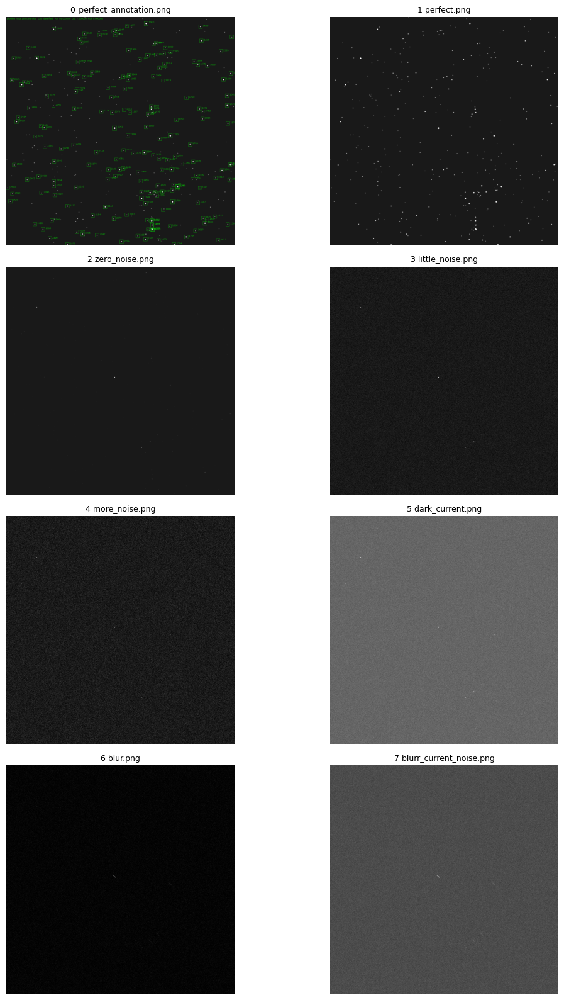

In [8]:
cols = 2  # images per line
rows = math.ceil(len(files) / cols)

plt.figure(figsize=(12, 4 * rows))

for i, file in enumerate(files):
    img = cv2.imread(os.path.join(image_path, file))

    if img is None:
        raise FileNotFoundError(f"Image not found or failed to load: {image_path}")


    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(file, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()


These images are examples of all the possible case scenarios that are taken into account in the whole dataset on which we'll be working on after the algorithm for star detection is set.
The idea is to work on each different case, building a layered algorithm that can adapt to each possible case.

We start with a simple grey level analisis to understand the initial situation.

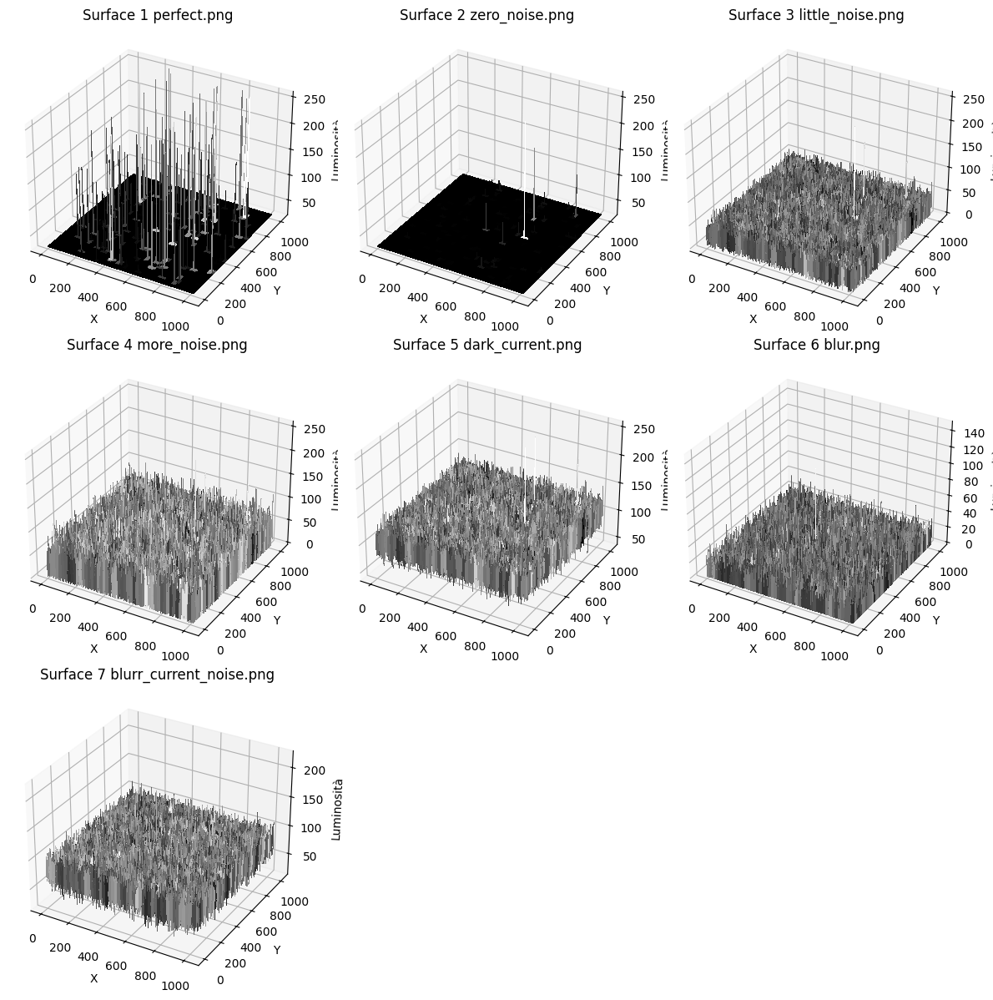

In [9]:
#Saving the greyscales for future uses
greyscales = []

cols = 3
rows = math.ceil(len(files) / cols)

fig = plt.figure(figsize=(12, 4 * rows))

plot_index = 1 

for i, file in enumerate(files):
    img = cv2.imread(os.path.join(image_path, file))

    if img is None:
        raise FileNotFoundError(f"Image not found or failed to load: {image_path}")
    elif  i == 0:
        continue

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    greyscales.append(gray_img)

    # Getting dimensions
    H, W = gray_img.shape

    X, Y = np.meshgrid(np.arange(W), np.arange(H))
    Z = gray_img

    # Creating 3D plot
    ax = fig.add_subplot(rows, cols, plot_index, projection='3d')
    plot_index += 1

    ax.plot_surface(X, Y, Z, cmap='gray', linewidth=0, antialiased=False)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Luminosità')
    ax.set_title(f"Surface {file}")

plt.tight_layout()
plt.show()


As noticible the first two cases, with zero noise, present quite a clear graph of level of grey, from which it is easy to distinguish among the background and the stars.
In this two cases we would only need to set a threshold above which every luminous peak would represent a star.

To set this threshold we can draw a cumulative histogram for grey levels and choose the value from which less and less pixel assume that level of grey

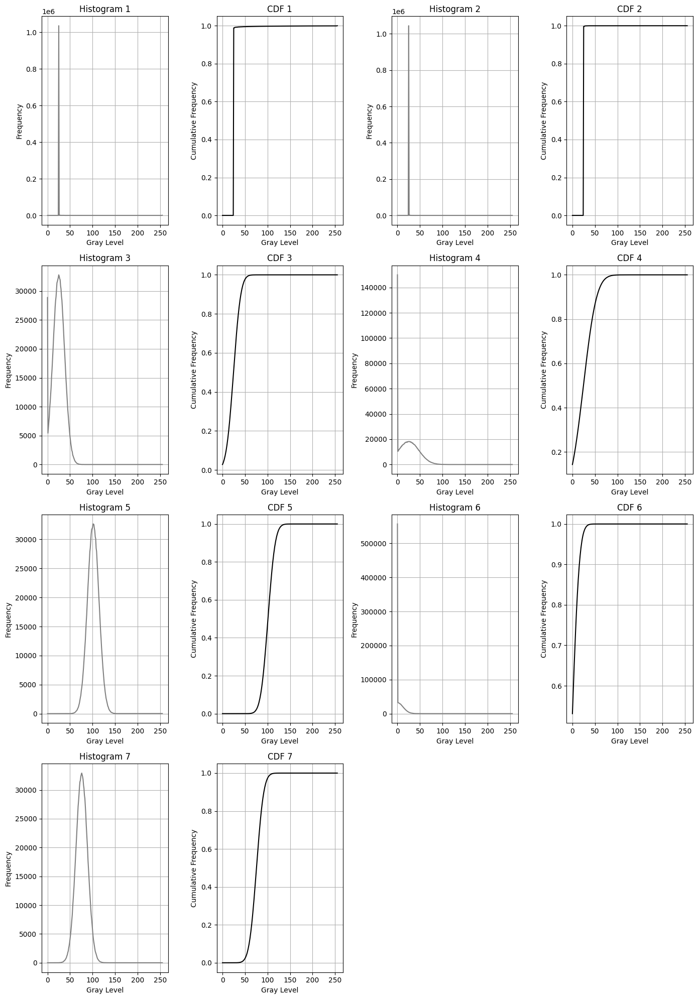

In [10]:
# Histogram and CDF plots for each greyscale image
cols = 2                     
rows = math.ceil(len(greyscales) / cols)

# Each image will have two plots: histogram + CDF
fig = plt.figure(figsize=(14, 5 * rows))

plot_index = 1

for i, img in enumerate(greyscales):

    # Histogram
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

    # Cumulative Histogram
    cum_hist = hist.cumsum()
    cum_hist_norm = cum_hist / cum_hist[-1]   # normalized (0–1)

    # --- HISTOGRAM ---
    ax1 = fig.add_subplot(rows, cols * 2, plot_index)   # two columns per image
    plot_index += 1

    ax1.plot(hist, color='gray')
    ax1.set_title(f"Histogram {i + 1}")
    ax1.set_xlabel("Gray Level")
    ax1.set_ylabel("Frequency")
    ax1.grid(True)

    # --- CUMULATIVE HISTOGRAM (CDF) ---
    ax2 = fig.add_subplot(rows, cols * 2, plot_index)
    plot_index += 1

    ax2.plot(cum_hist_norm, color='black')
    ax2.set_title(f"CDF {i + 1}")
    ax2.set_xlabel("Gray Level")
    ax2.set_ylabel("Cumulative Frequency")
    ax2.grid(True)

plt.tight_layout()
plt.show()


We know that in star images most of the image is taken by the background, with a very low percentage of pixel representing stars.
For this reason we expect the low level of grey to have the biggest number of pixel.
This is exactly what happens in each graph, with the difference of graphs like the gaussian one that warns about the presence of some kind of noise.
For the moment we start from the basis of our algorithm and we set a threshold where the gray level value has taken more than the 80% of the pixels.
We will after refine this threshold and update resolution for each and every case.

Rilevati 312 picchi nell'immagine 1
Rilevati 312 picchi nell'immagine 2
Rilevati 9021 picchi nell'immagine 3
Rilevati 8797 picchi nell'immagine 4
Rilevati 9041 picchi nell'immagine 5
Rilevati 9041 picchi nell'immagine 6
Rilevati 9050 picchi nell'immagine 7


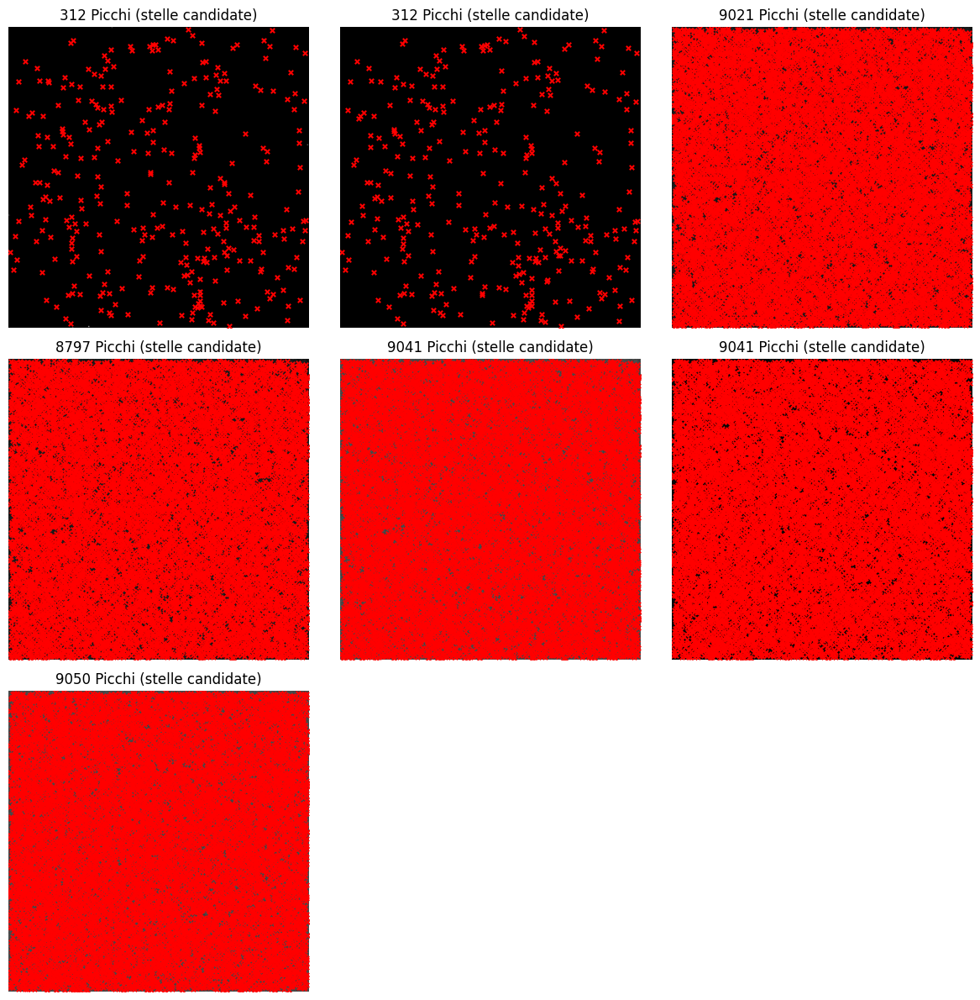

In [14]:
cols = 3
rows = math.ceil(len(greyscales) / cols)

fig = plt.figure(figsize=(12, 4 * rows))

plot_index = 1 

for i, img in enumerate(greyscales):

    threshold = np.percentile(img, 80)

    # Detecting peaks distant at least 5 pixels and above the threshold
    coordinates = peak_local_max(img, min_distance=5, threshold_abs=threshold)
    print(f"Rilevati {len(coordinates)} picchi nell'immagine {i + 1}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    plt.scatter(coordinates[:, 1], coordinates[:, 0], c='red',  s=15, marker='x')
    plt.title(f"{len(coordinates)} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()


As it is is visible using the threshold computed in this way is optimal for the first two cases, but for the rest of the cases we need to add some more information in order to create new conditions in the algorithm.
Notice that the reason for which we say that computing local peaks works on image 1 and 2 is that in those cases we have zero or close to zero noise, meaning that everything above the background value is an object, or in our case, a star.
This is well visible from the greylevels 3d plot and from the histograms.

Let's now focus on the images 3, 4, 5, all depicting an increasing noise

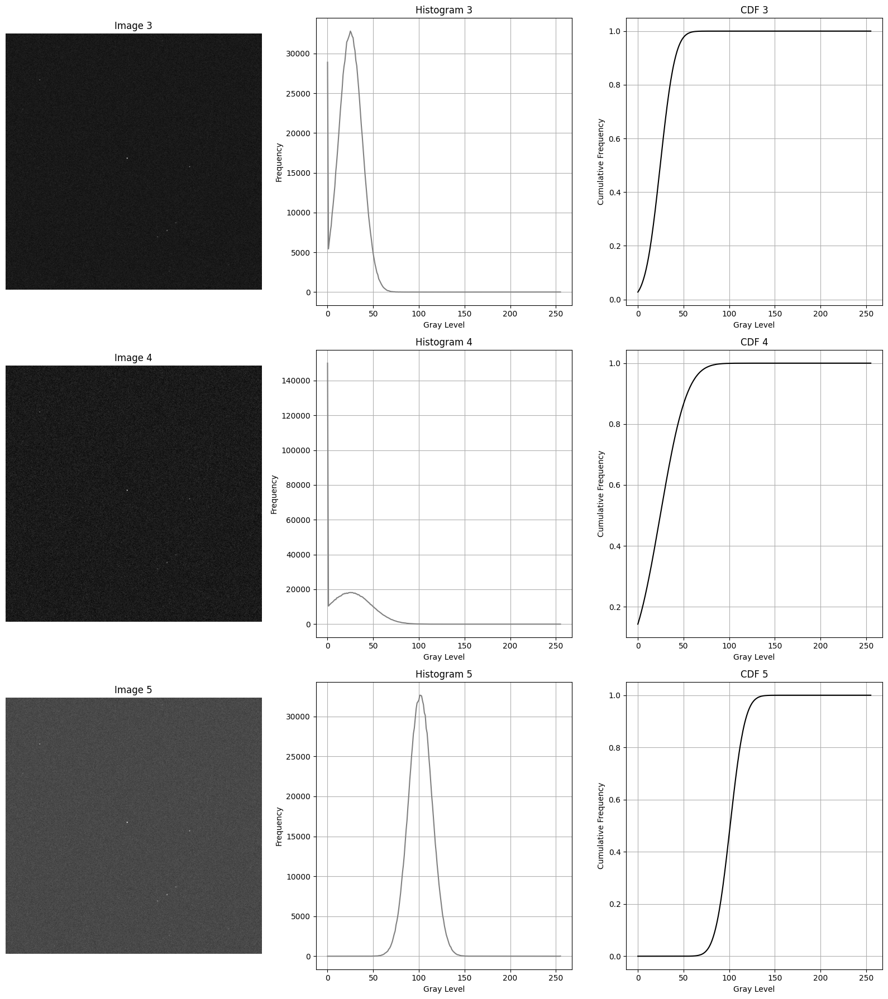

In [15]:
cols = 1                      
rows = 3                      

fig = plt.figure(figsize=(16, 6 * rows))
plot_index = 1

for i, img in enumerate(greyscales):

    if i < 2 or i > 4:
        continue  # keeping only images 2, 3, and 4

    # --- HISTOGRAM ---
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

    # --- CDF ---
    cum_hist = hist.cumsum()
    cum_hist_norm = cum_hist / cum_hist[-1]

    # --- IMAGE ---
    ax0 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax0.imshow(img, cmap='gray')
    ax0.set_title(f"Image {i + 1}")
    ax0.axis('off')

    # --- HISTOGRAM ---
    ax1 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax1.plot(hist, color='gray')
    ax1.set_title(f"Histogram {i + 1}")
    ax1.set_xlabel("Gray Level")
    ax1.set_ylabel("Frequency")
    ax1.grid(True)

    # --- CDF ---
    ax2 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax2.plot(cum_hist_norm, color='black')
    ax2.set_title(f"CDF {i + 1}")
    ax2.set_xlabel("Gray Level")
    ax2.set_ylabel("Cumulative Frequency")
    ax2.grid(True)

plt.tight_layout()
plt.show()


We can see that in the three pictures above the noise is increasing and extending in the shades of grey.
If in the first case, the histogram reveals a peak of the noise in the small range of 20-40, in the other cases the noise is generally more distributed.
While with the image 3, streching the level of grey in which the density of pixel is limited would bring to better results, in the other two cases, it would amplify also the noise, leading to worse results. For this reason, we will first study the nature and the model describing the noise, to then stretch the grey levels of the denoised image. 

In a denoised image we would have an histogram representing a very strict peak in between the values 0 and 40, which is more or less the grey level of the background. In our case, we have experimented with completely denoised pictures with a background peak around the 25-26 value. We will start from this information to compute the model of the noise

We have four kind of noise in our images:
- The Read/Electrical noise(Gaussian): Widens the histogram around the values of the background
- The Shot noise(Poisson): Given by the light of the stars, it is very small and affects only the pixels near the stars
- The Dark Current noise (Exponential/Poisson): Distributed along the whole image and generated by the fact that each pixel generates a small difference of dark current
- The Quantization noise: here negligible

Because the shot and the quantization noise are negligible in our images, we can say that the image composition is structured in the following way:

Image = Background + ReadNoise + DarkNoise + Stars

Where Background≈25−26, ReadNoise ∼N(0,σ^2) and DarkNoise is a slow-varying offset.

Let's start by computing the ReadNoise variance

In [16]:
def estimate_sigma(image):
    median_val = np.median(image)
    mad = np.median(np.abs(image - median_val))
    sigma = 1.4826 * mad   # converts MAD to std for Gaussian
    return sigma

In [20]:
sigma_estimates = [] #for images 3, 4, 5

noise_images = [greyscales[2], greyscales[3], greyscales[4]]

for i, img in enumerate(noise_images):
    sigma_est = estimate_sigma(img)
    sigma_estimates.append(sigma_est)
    print(f"Estimated noise sigma for image {i + 3}: {sigma_est:.2f}")


Estimated noise sigma for image 3: 13.34
Estimated noise sigma for image 4: 23.72
Estimated noise sigma for image 5: 13.34


Even though it might sound strange that for two very different kind of images we have two similar values in variance, we have to better look at the histogram distribution. While the gaussian is moved to the left side, its "amplitude" remains quite similar. For the image4 instead, the gaussian is quite wider even though it stays shorter.

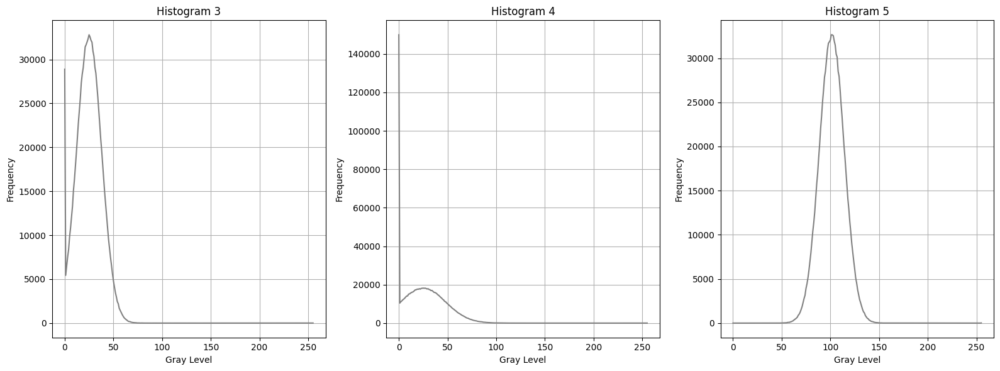

In [21]:
cols = 3                      
rows = 1                     

fig = plt.figure(figsize=(16, 6 * rows))
plot_index = 1

for i, img in enumerate(greyscales):

    if i < 2 or i > 4:
        continue  

    # --- HISTOGRAM ---
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

    # --- HISTOGRAM ---
    ax1 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax1.plot(hist, color='gray')
    ax1.set_title(f"Histogram {i + 1}")
    ax1.set_xlabel("Gray Level")
    ax1.set_ylabel("Frequency")
    ax1.grid(True)

plt.tight_layout()
plt.show()

Now, we have said that we have some gaussian noise, but then what are the high peak at the very low level in the first two histogram, and how should we work with them?
This peaks are given by the clipping. Clipping occurs when preprocessing produces negative pixel values, which are forced to 0 in the digital representation. This creates an artificial spike at low intensities (0-10 range) but it does not represent physical noise, so we can ignore it when estimating the background.


What we need to do now is to align the peak of the gaussian to where the denoised background peak is located, which is around the value of 25 value (this is true for every star detection image).

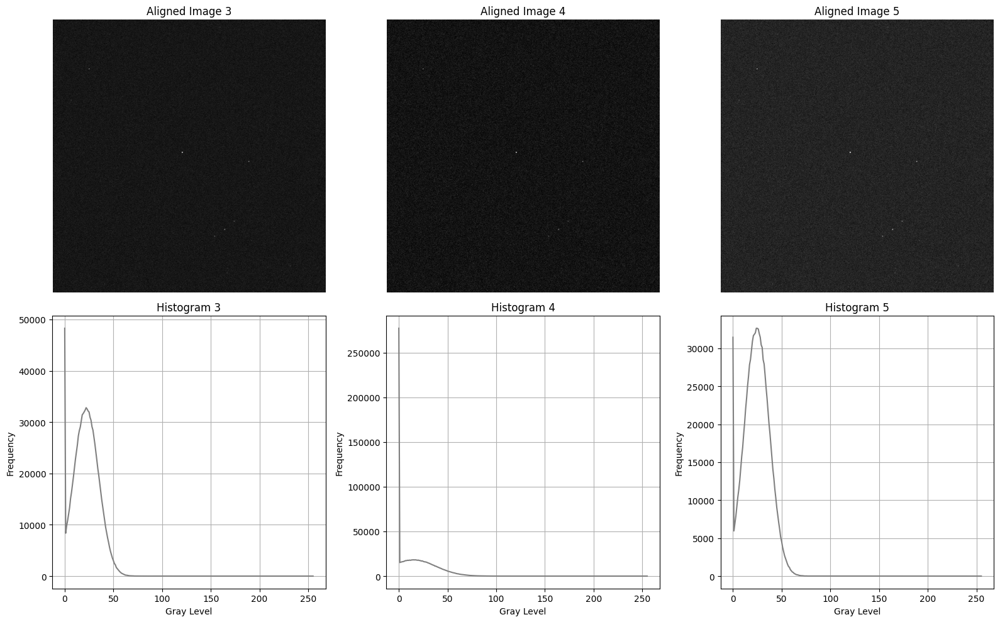

In [23]:
#Computing the safe range and fitting Gaussian to the histograms 
safe_lower = 10 #clipping value to avoid low-intensity noise

imges_safe = []

for img in noise_images:
    img_safe = img[(img >= safe_lower)]
    imges_safe.append(img_safe)

#Fitting the gaussians
mu_s = []
sigma_s = []
for img_safe in imges_safe:
    mu, sigma = norm.fit(img_safe)
    mu_s.append(mu)
    sigma_s.append(sigma)


denoised_peak = 25.5

delta_s = []

for mu in mu_s:
    delta = denoised_peak - mu
    delta_s.append(delta)

#Aligning the images

aligned_images = []
for i, img in enumerate(noise_images):
    delta = delta_s[i]
    img_aligned = np.clip(img + delta, 0, 255)
    aligned_images.append(img_aligned)

titles = ["Aligned Image 3", "Aligned Image 4", "Aligned Image 5"]

# Computing histograms of aligned images

histograms = [
    np.histogram(aligned_images[0].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(aligned_images[1].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(aligned_images[2].flatten(), bins=256, range=[0, 256])[0]
]

# Plotting the results
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# --- Row 1: Images ---
for i in range(3):
    axes[0, i].imshow(aligned_images[i], cmap='gray')
    axes[0, i].set_title(titles[i])
    axes[0, i].axis('off')

# --- Row 2: Histograms ---
for i in range(3):
    axes[1, i].plot(histograms[i], color='gray')
    axes[1, i].set_title(f"Histogram {i+3}")
    axes[1, i].set_xlabel("Gray Level")
    axes[1, i].set_ylabel("Frequency")
    axes[1, i].grid(True)

plt.tight_layout()
plt.show()


The next step is to make the gaussian variance smaller and smaller in order to reduce the noise. To do this we are going to use the Wavelet thresholding, which means that we are going to shrink the small coefficients in detail bands

We use the soft thresholding , in order to preserve the stars' large coefficients

$$
c' =
\begin{cases}
0, & \text{if } |c| < T \\
c - T \cdot \operatorname{sign}(c), & \text{if } |c| \ge T
\end{cases}
$$

For the Gaussian noise we can simply choose a threshold of 

$$
T = 3\sigma
$$

In [25]:
!pip install PyWavelets
import pywt


[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: C:\Users\anjel\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [26]:
def wavelet_denoise(img, sigma, wave='db2', level=3, k=3):
    # Wavelet decomposition
    coeffs = pywt.wavedec2(img, wave, level=level)

    # Threshold based on noise
    T = k * sigma

    # Process detail coefficients (skip approximation coeffs[0])
    coeffs_thresh = [coeffs[0]]  # keep the approximation untouched

    for detail_level in coeffs[1:]:
        cH, cV, cD = detail_level
        cH = pywt.threshold(cH, T, mode='soft')
        cV = pywt.threshold(cV, T, mode='soft')
        cD = pywt.threshold(cD, T, mode='soft')
        coeffs_thresh.append((cH, cV, cD))

    # Reconstruct denoised image
    denoised = pywt.waverec2(coeffs_thresh, wave)
    return np.clip(denoised, 0, 255).astype(np.uint8)

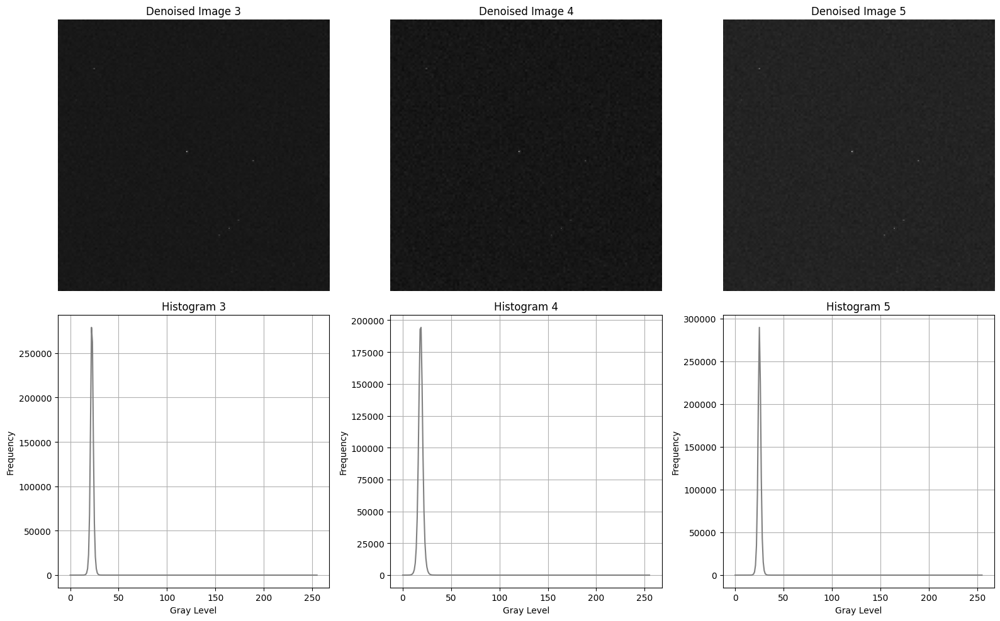

In [28]:
denoised_images = []

for i, img in enumerate(aligned_images):
    sigma = sigma_estimates[i]
    denoised_img = wavelet_denoise(img, sigma)
    denoised_images.append(denoised_img)

titles = ["Denoised Image 3", "Denoised Image 4", "Denoised Image 5"]

#Computing histograms of denoised images
histograms = [
    np.histogram(denoised_images[0].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(denoised_images[1].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(denoised_images[2].flatten(), bins=256, range=[0, 256])[0]
]

# Plotting the results
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Images
for i in range(3):
    axes[0, i].imshow(denoised_images[i], cmap='gray')
    axes[0, i].set_title(titles[i])
    axes[0, i].axis('off')

# Histograms
for i in range(3):
    axes[1, i].plot(histograms[i], color='gray')
    axes[1, i].set_title(f"Histogram {i+3}")
    axes[1, i].set_xlabel("Gray Level")
    axes[1, i].set_ylabel("Frequency")
    axes[1, i].grid(True)

plt.tight_layout()
plt.show()


While the gaussians are stricter, also the clipping disappears because tha background alignment deletes the negative values while the wavelet denoising reduces the variance, avoiding the generation of pixel with negative or very low values.

we can now compare grey levels 3d plots, before and after tuning, in order to better check images improvements.

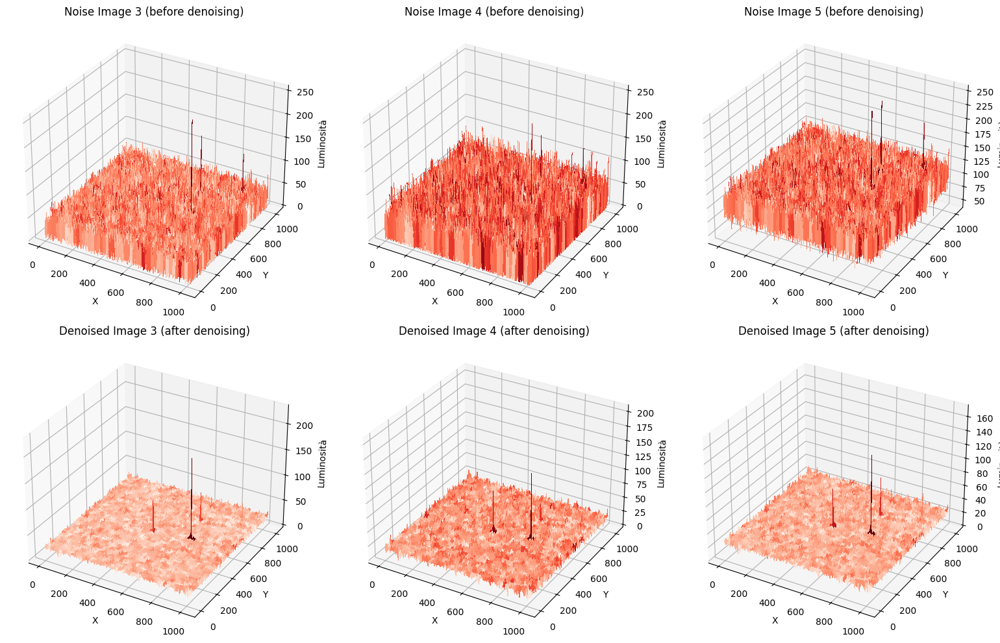

In [33]:
cols = 3
rows = 2

fig = plt.figure(figsize=(16, 10))

plot_index = 1

# 3D Surface noise_images 
for i, img in enumerate(noise_images):
    H, W = img.shape
    X, Y = np.meshgrid(np.arange(W), np.arange(H))
    Z = img
    
    ax = fig.add_subplot(rows, cols, plot_index, projection='3d')
    plot_index += 1
    
    ax.plot_surface(X, Y, Z, cmap='Reds', linewidth=0, antialiased=False)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Luminosità')
    ax.set_title(f"Noise Image {i + 3} (before denoising)")

# 3D Surface dei denoised_images 
for i, img in enumerate(denoised_images):
    H, W = img.shape
    X, Y = np.meshgrid(np.arange(W), np.arange(H))
    Z = img
    
    ax = fig.add_subplot(rows, cols, plot_index, projection='3d')
    plot_index += 1
    
    ax.plot_surface(X, Y, Z, cmap='Reds', linewidth=0, antialiased=False)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Luminosità')
    ax.set_title(f"Denoised Image {i + 3} (after denoising)")

plt.tight_layout()
plt.show()


As we can see, the larger stars are more visible, but the rest of the image looks a bit “flattened.”
This effect comes from the use of filters: it can be reduced but not completely removed.
Luckily, this is not a big problem for us, because the stars we want to detect have a Gaussian shape, and Gaussian operations always produce another Gaussian.
So even if the stars look smaller after filtering, we only need to detect the “Gaussian-like” changes in the image to find them. Their exact size is not very important once we set a threshold for the difference in brightness levels.

### Star detection main function

To write a correct function for star detection we need to move with small steps, starting from a basic idea and making it more and more precise by working on parameters and thresholds.
The main idea behind star detection is "scanning" the image with a window of a certain size and checking for stars by looking at the variations contained in that window each time we move it.

However, to better analyze variations within the window is very useful to use an inner one. By using two windows instead of one we can simplify computation, going from data modeling two simple mean comparison. While the first might be more precise, it is quite difficult to implement due to its high computational cost and the "flattening" of the image after the filtering.
For this reason our base detection function is a nested windows based one.

In [34]:
def detect_stars_nested_base(img, A_size=3, B_size=7, th_mean=2, th_std=1):
    rA = A_size // 2
    rB = B_size // 2

    H, W = img.shape
    stars = []

    for y in range(rB, H - rB):
        for x in range(rB, W - rB):

            A = img[y - rA : y + rA + 1, x - rA : x + rA + 1]
            B = img[y - rB : y + rB + 1, x - rB : x + rB + 1]

            center = img[y, x]

            # Condition 1: center is max of A
            if center != np.max(A):
                continue

            mean_A = np.mean(A)
            mean_B = np.mean(B)
            if mean_A <= mean_B + th_mean:
                continue

            var_A = np.var(A)
            var_B = np.var(B)
            if var_A <= var_B + th_std:
                continue

            stars.append((x, y))

    return stars


Rilevati 6 picchi nell'immagine 3
Rilevati 4 picchi nell'immagine 4
Rilevati 6 picchi nell'immagine 5


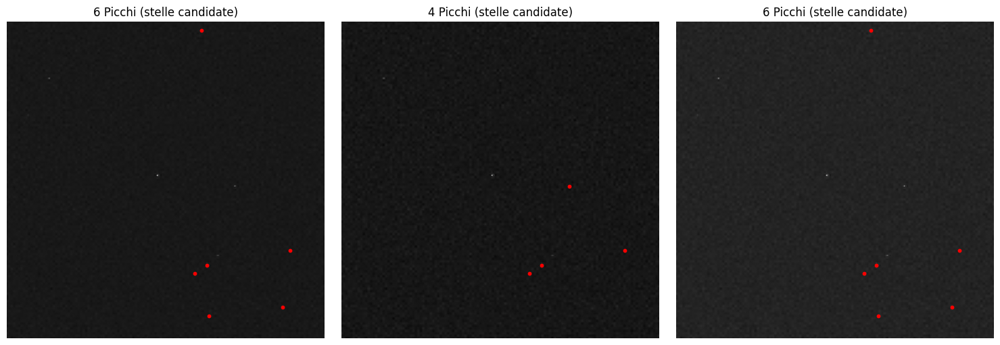

In [51]:
cols = 3
rows = 1

stars_nested = [None] * len(denoised_images)

fig = plt.figure(figsize=(15, 5))

for i, img in enumerate(denoised_images):
    
    stars_nested[i] = detect_stars_nested_base(img)
    print(f"Rilevati {len(stars_nested[i])} picchi nell'immagine {i + 3}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    for x, y in stars_nested[i]:
        plt.scatter(x, y, c='red', s=10)
    plt.title(f"{len(stars_nested[i])} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()


As it is visible this basic function is not too performative, as it takes time to elaborate the images and it is not capable to detect stars that are visible at the eye. To understand how to correctly adjust the function for better performances, it is a good approach to test it with different parameters and analyse the different results

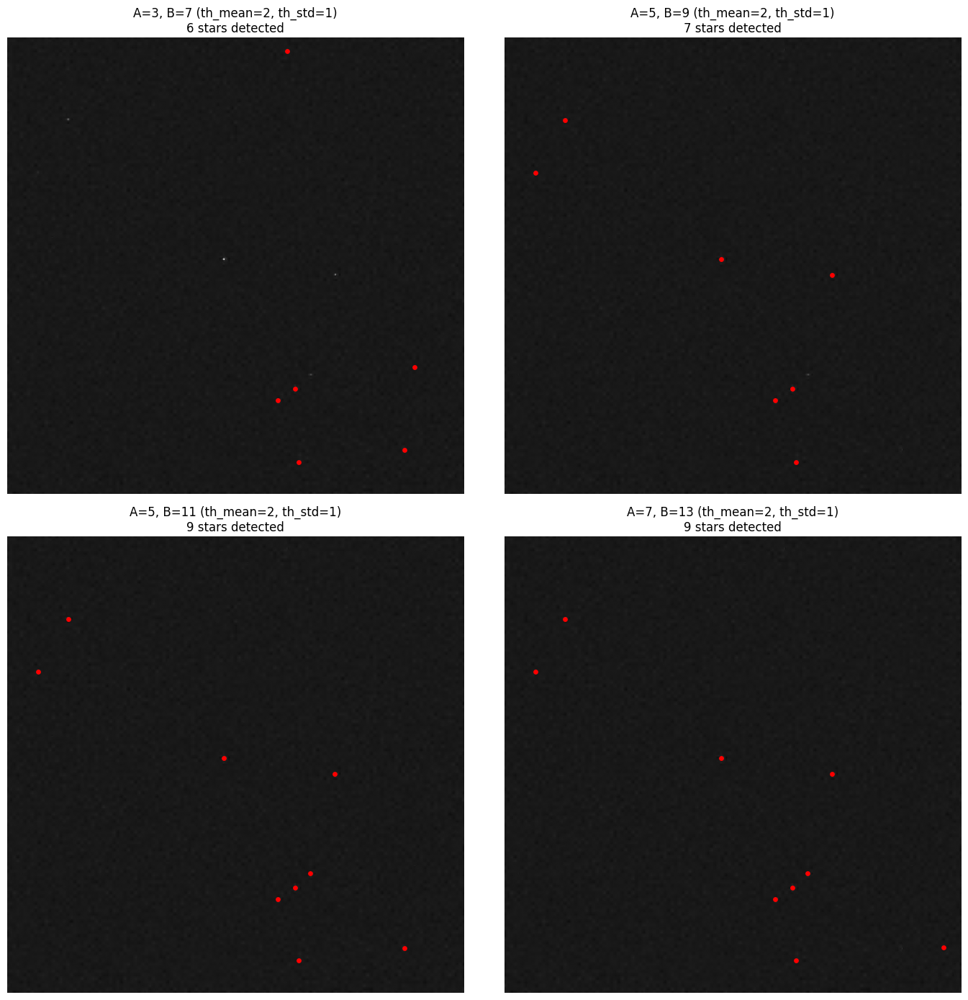

In [38]:
# Testing with different WINDOW SIZES (fixed thresholds)
test_img = denoised_images[0]

# Fixed threshold values
th_mean_fixed = 2
th_std_fixed = 1

# Define 4 different window size combinations
window_params = [
    {'A_size': 3, 'B_size': 7, 'label': 'A=3, B=7'},
    {'A_size': 5, 'B_size': 9, 'label': 'A=5, B=9'},
    {'A_size': 5, 'B_size': 11, 'label': 'A=5, B=11'},
    {'A_size': 7, 'B_size': 13, 'label': 'A=7, B=13'}
]

# Create 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()

for idx, params in enumerate(window_params):
    A_size = params['A_size']
    B_size = params['B_size']
    label = params['label']
    
    # Detect stars with current window sizes
    stars = detect_stars_nested_base(test_img, A_size=A_size, B_size=B_size, 
                                      th_mean=th_mean_fixed, th_std=th_std_fixed)
    
    # Plot
    axes[idx].imshow(test_img, cmap='gray')
    for x, y in stars:
        axes[idx].scatter(x, y, c='red', s=15)
    axes[idx].set_title(f"{label} (th_mean={th_mean_fixed}, th_std={th_std_fixed})\n{len(stars)} stars detected")
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

As it is visible, by choosing bigger windows we can identify bigger stars, ending up with a better detection rate when working on close constellation.
However, working with bigger windows is not always a good decision as it might "flatten" the research by not detecting smaller stars which end up hidden in the mean value of the inner window.
In order to avoid hiding stars in computations or ignoring bigger stars, the best decision is to scan the image with different sets of windows.

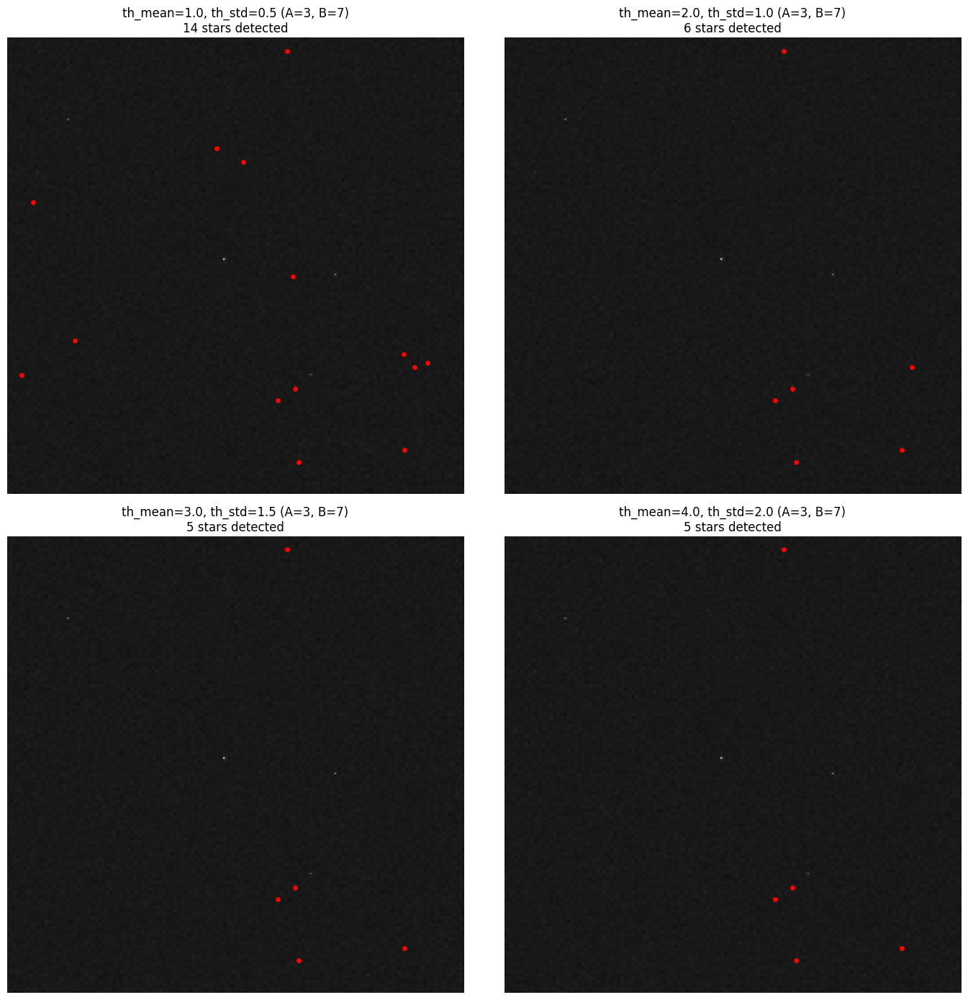

In [39]:
# Testing with different THRESHOLD VALUES (fixed window sizes)
test_img = denoised_images[0]

# Fixed window sizes
A_size_fixed = 3
B_size_fixed = 7

# Define 4 different threshold combinations
threshold_params = [
    {'th_mean': 1.0, 'th_std': 0.5, 'label': 'th_mean=1.0, th_std=0.5'},
    {'th_mean': 2.0, 'th_std': 1.0, 'label': 'th_mean=2.0, th_std=1.0'},
    {'th_mean': 3.0, 'th_std': 1.5, 'label': 'th_mean=3.0, th_std=1.5'},
    {'th_mean': 4.0, 'th_std': 2.0, 'label': 'th_mean=4.0, th_std=2.0'}
]

# Create 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()

for idx, params in enumerate(threshold_params):
    th_mean = params['th_mean']
    th_std = params['th_std']
    label = params['label']
    
    # Detect stars with current thresholds
    stars = detect_stars_nested_base(test_img, A_size=A_size_fixed, B_size=B_size_fixed, 
                                      th_mean=th_mean, th_std=th_std)
    
    # Plot
    axes[idx].imshow(test_img, cmap='gray')
    for x, y in stars:
        axes[idx].scatter(x, y, c='red', s=15)
    axes[idx].set_title(f"{label} (A={A_size_fixed}, B={B_size_fixed})\n{len(stars)} stars detected")
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

As it is visible, by choosing smaller values of thresholds we can detect less bright stars. An idea is to use relative thresholds instead of absolute ones. But we will work on this point later on, after having first worked on the window size. 

In [ ]:
def detect_stars_multiscale(img, 
                            A_sizes=[3,5,7], 
                            B_sizes=[7,11,15],
                            th_mean=4, th_std=3): 

    stars = []
    H, W = img.shape

    # Loop su tutte le scale
    for A_size, B_size in zip(A_sizes, B_sizes):
        rA = A_size // 2
        rB = B_size // 2

        for y in range(rB, H - rB):
            for x in range(rB, W - rB):

                A = img[y-rA:y+rA+1, x-rA:x+rA+1]
                B = img[y-rB:y+rB+1, x-rB:x+rB+1]

                center = img[y, x]

                # Condition 1: the center must be a local maximum in A
                if center != np.max(A):
                    continue

                # Condition 2: the mean of A must be significantly higher than B
                mean_A = np.mean(A)
                mean_B = np.mean(B)
                if mean_A <= mean_B + th_mean:
                    continue

                # Condition 3: the variance of A must be higher than B (star = variation)
                var_A = np.var(A)
                var_B = np.var(B)
                if var_A <= var_B + th_std:
                    continue

                stars.append((x, y))

    # Remove duplicates keeping only the star closest to the center
    # if there are multiple stars within 3 pixels
    if len(stars) == 0:
        return []
    
    stars_array = np.array(stars)
    from scipy.spatial.distance import cdist
    
    # Compute pairwise distances
    distances = cdist(stars_array, stars_array)
    
    # Find clusters of nearby stars (within 3 pixels)
    keep = []
    used = set()
    
    for i in range(len(stars)):
        if i in used:
            continue
        
        # Find all nearby stars
        close_stars = np.where((distances[i] < 3) & (distances[i] > 0))[0]
        
        if len(close_stars) == 0:
            keep.append(stars[i])
            used.add(i)
        else:
            # Keep only one star per cluster (the most central one)
            cluster_indices = [i] + list(close_stars)
            cluster_stars = [stars[idx] for idx in cluster_indices]
            
            # Keep the star at the center of the cluster
            cluster_center = np.mean(cluster_stars, axis=0)
            distances_to_center = [np.linalg.norm(np.array(s) - cluster_center) for s in cluster_stars]
            best_idx = cluster_indices[np.argmin(distances_to_center)]
            
            keep.append(stars[best_idx])
            used.update(cluster_indices)
    
    return keep

Rilevati 21 picchi nell'immagine 3
Rilevati 20 picchi nell'immagine 4
Rilevati 21 picchi nell'immagine 5


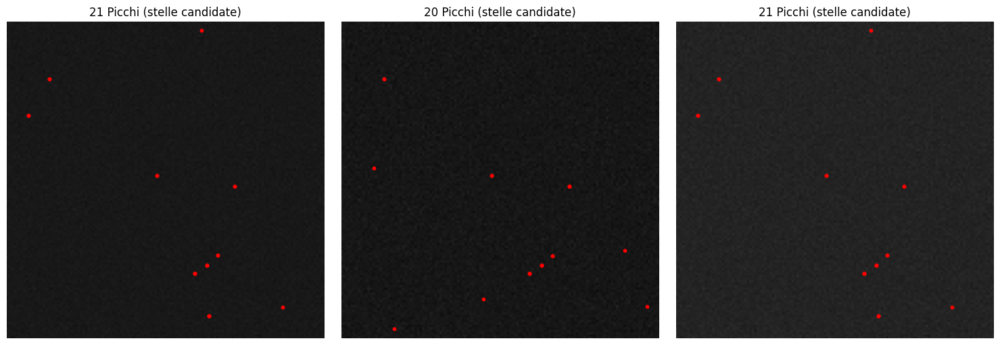

In [50]:
cols = 3
rows = 1

stars_multiscale = [None] * len(denoised_images)

fig = plt.figure(figsize=(15, 5))

for i, img in enumerate(denoised_images):
    
    stars_multiscale[i] = detect_stars_multiscale(img)
    print(f"Rilevati {len(stars_multiscale[i])} picchi nell'immagine {i + 3}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    for x, y in stars_multiscale[i]:
        plt.scatter(x, y, c='red', s=10)
    plt.title(f"{len(stars_multiscale[i])} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()


By using windows of different dimensions we are detecting more stars.
To not fall into the mistake of lowering making the conditions for star detection more and more flexible to detect the maximum number of stars possible, possible detecting also noise as one of those, it is better to first check the quality of our results and then to work on parameter tuning.

In [54]:
# Quantitative analysis: how many detected stars correspond to the ground truth

threshold_perf = np.percentile(greyscales[0], 80)
stars_perfect = peak_local_max(greyscales[0], min_distance=5, threshold_abs=threshold_perf)

stars_multiscale = [detect_stars_multiscale(img) for img in denoised_images]

def match_with_ground_truth(detected_stars, ground_truth, max_distance=5):

    if len(detected_stars) == 0 or len(ground_truth) == 0:
        return 0, 0, 0
    
    detected_array = np.array(detected_stars)
    # ground_truth already in form (y, x), convert to (x, y)
    gt_array = ground_truth[:, [1, 0]]
    
    # Calculate distances between detected stars and ground truth
    distances = cdist(detected_array, gt_array)
    
    # Count matches (detected star within max_distance of a true star)
    matches = 0
    matched_gt = set()
    
    for i in range(len(detected_array)):
        min_dist_idx = np.argmin(distances[i])
        if distances[i, min_dist_idx] <= max_distance:
            matches += 1
            matched_gt.add(min_dist_idx)
    
    true_positives = matches
    false_positives = len(detected_stars) - matches
    false_negatives = len(ground_truth) - len(matched_gt)
    
    return true_positives, false_positives, false_negatives

print("\n=== Match Analysis ===\n")
for i, stars in enumerate(stars_multiscale):
    tp, fp, fn = match_with_ground_truth(stars, stars_perfect, max_distance=5)
    
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    print(f"Image {i+3}:")
    print(f"  True Positives:  {tp}")
    print(f"  False Positives: {fp}")
    print(f"  False Negatives: {fn}")
    print(f"  Precision: {precision:.2%}")
    print(f"  Recall:    {recall:.2%}")
    print(f"  F1-Score:  {f1:.2%}")
    print()


=== Match Analysis ===

Image 3:
  True Positives:  21
  False Positives: 0
  False Negatives: 302
  Precision: 100.00%
  Recall:    6.50%
  F1-Score:  12.21%

Image 4:
  True Positives:  15
  False Positives: 5
  False Negatives: 306
  Precision: 75.00%
  Recall:    4.67%
  F1-Score:  8.80%

Image 5:
  True Positives:  21
  False Positives: 0
  False Negatives: 302
  Precision: 100.00%
  Recall:    6.50%
  F1-Score:  12.21%



As we can see the results are quite good for precision, which is the parameter we want to maximize.
The only images that brings error is the fourth one, but for the moment we can accept this kind of error as we have not worked on parameter tuning already.

For the moment we can test the function with all the images to start having an idea of how to improve it

Rilevati 760 picchi nell'immagine 1
Rilevati 70 picchi nell'immagine 2
Rilevati 25 picchi nell'immagine 3
Rilevati 47 picchi nell'immagine 4
Rilevati 20 picchi nell'immagine 5
Rilevati 21 picchi nell'immagine 6
Rilevati 2 picchi nell'immagine 7


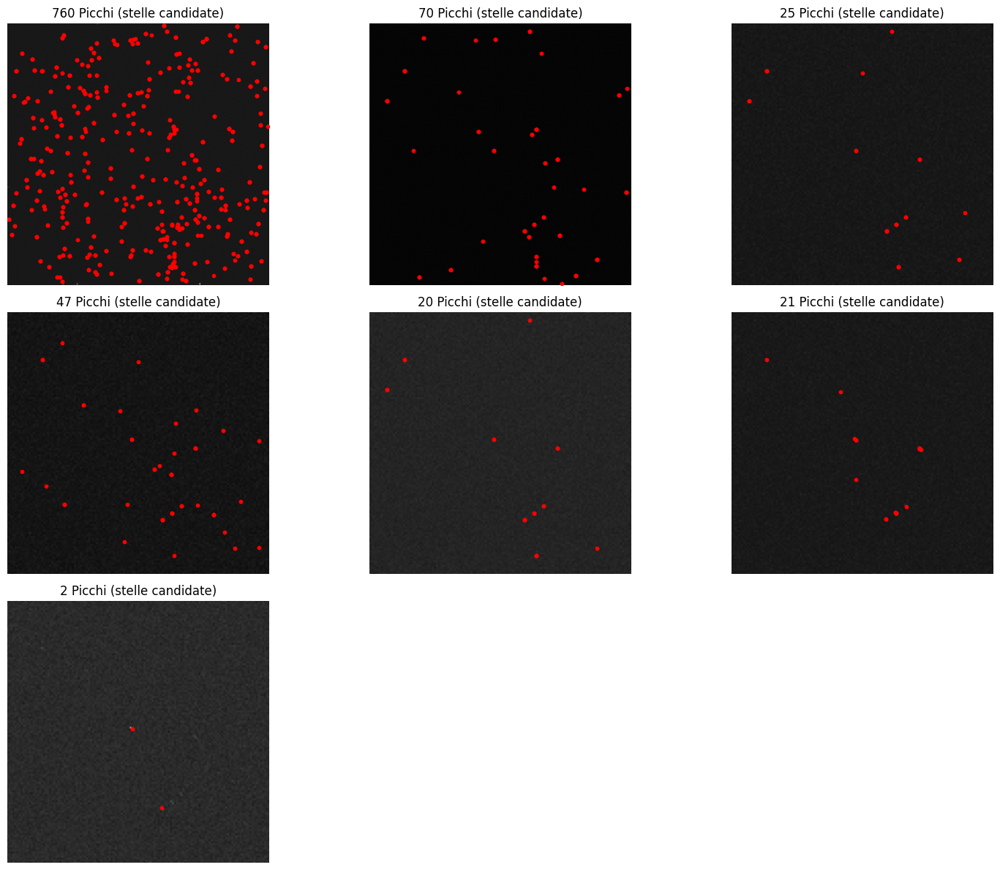

In [56]:
sigma_s_tot = []
mu_s_tot = []
delta_s_tot = []
safe_images_tot = []
aligned_images_tot = []
denoised_images_tot = []

safe_lower = 10
denoised_peak = 25.5

for i, img in enumerate(greyscales):

    #staying in safe range
    safe_images_tot.append(img[(img >= safe_lower)])

    #fitting gaussians
    mu, sigma = norm.fit(safe_images_tot[i])
    mu_s_tot.append(mu)
    sigma_s_tot.append(sigma)

    delta_s_tot.append(denoised_peak - mu)

    #aligning images
    aligned_images_tot.append(np.clip(img + delta_s_tot[i], 0, 255))

    #denoising images
    denoised_images_tot.append(wavelet_denoise(aligned_images_tot[i], sigma_s_tot[i]))

# Test on all denoised images
cols = 3
rows = 3

stars_multiscale = [None] * len(denoised_images_tot)
fig = plt.figure(figsize=(15, 12))

for i, img in enumerate(denoised_images_tot):
    
    stars_multiscale[i] = detect_stars_multiscale(img)
    print(f"Rilevati {len(stars_multiscale[i])} picchi nell'immagine {i + 1}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    for x, y in stars_multiscale[i]:
        plt.scatter(x, y, c='red', s=10)
    plt.title(f"{len(stars_multiscale[i])} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()

For the first two cases, with very small noise or zero noise, the peak computation is the "absolute" method. For this reason when writing the final function we will compute the noise before selecting the right procedure. 
Regarding the last two images instead, we can see that if in the sixth image one star is detected as multiple, in the last one, only two stars are detected, even though we can see that there are more. To tune the parameters in order to solve this problem, it's better to first analize these two pictures.

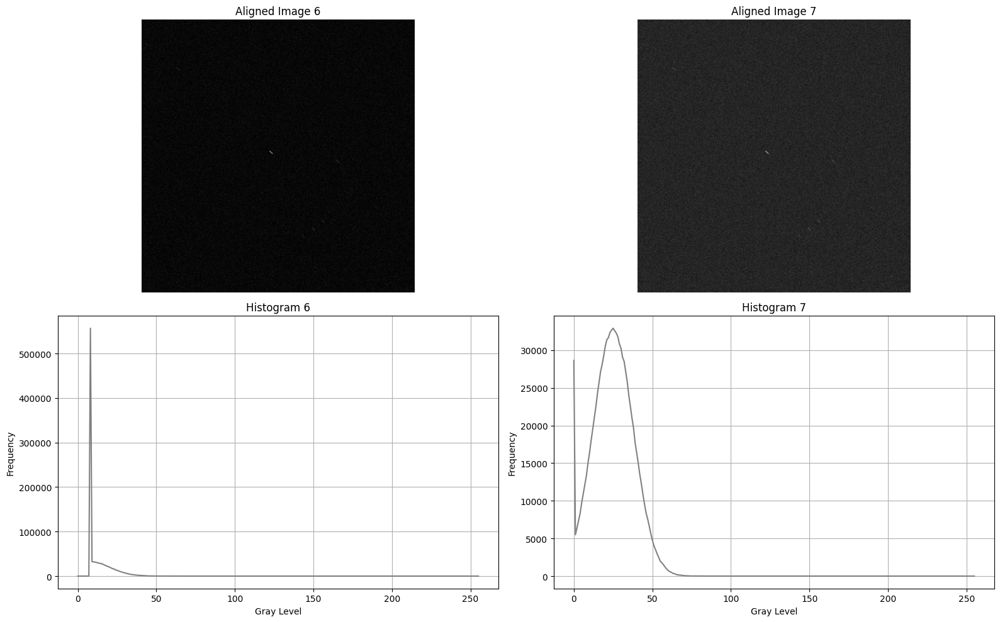

In [57]:
histograms = [
    np.histogram(aligned_images_tot[5].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(aligned_images_tot[6].flatten(), bins=256, range=[0, 256])[0],
]

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Images 
for i in range(2):
    axes[0, i].imshow(aligned_images_tot[i+5], cmap='gray')
    axes[0, i].set_title(f"Aligned Image {i+6}")
    axes[0, i].axis('off')

# Histograms
for i in range(2):
    axes[1, i].plot(histograms[i], color='gray')
    axes[1, i].set_title(f"Histogram {i+6}")
    axes[1, i].set_xlabel("Gray Level")
    axes[1, i].set_ylabel("Frequency")
    axes[1, i].grid(True)

plt.tight_layout()
plt.show()

We are working with some blurring noise that stretches the stars. For this kind of images, alignment and denoising is not enough. While the image can be improved in quality the stars remain stretched, not being identified as such by squared windows. We can solve the problem by working on eccentricity, windows dimensions and thresholds corrections.

## Adapting detection to stretched stars cases

In img6 and img7, stars are not circular but **stretched**, possibly because of optical aberration, motion during exposure or non-uniform defocus.

To enlarge windows based on the dimension of the possible star it is useful to use eccentricity. The main idea is to use it together with an additive factor to enlarge the window of only the necessary, without exaggerating and falling into "hiding" stars into too big windows.

Eccentricity is our choice because it works also for circular stars.

In [ ]:
#Rilevamento stelle multi-scala ADATTIVO per stelle allungate.
#Rileva l'eccentricità locale e adatta le finestre per stelle allungate.
# adapt_eccentricity: se True, adatta finestre per stelle allungate (img6, img7)
#ecc_threshold: soglia di eccentricità (default 0.4). Aumenta per più conservativo (0.5-0.6), diminuisci per più stelle (0.3)
#scale_eccentricity_factor: moltiplicatore (default 0.5). Aumenta a 1.0 o 1.5 per finestre più grandi


def detect_stars_multiscale_adaptive(img, 
                                     A_sizes=[3,5,7], 
                                     B_sizes=[7,11,15],
                                     th_mean=3, th_std=2,
                                     adapt_eccentricity=True,
                                     ecc_threshold=0.4,
                                     scale_eccentricity_factor=0.5):

    stars = []
    H, W = img.shape

    # Computing eccentricity map if adaptive is active
    eccentricity_map = None
    if adapt_eccentricity:
        eccentricity_map = np.zeros((H, W))
        # Use a radius of 5 pixels to calculate eccentricity
        for y in range(5, H - 5):
            for x in range(5, W - 5):
                # Extract 11x11 window centered
                window = img[y-5:y+6, x-5:x+6]
                # Calculate second order moments
                yy, xx = np.meshgrid(np.arange(11), np.arange(11), indexing='ij')
                weights = window / (np.sum(window) + 1e-8)
                
                mxx = np.sum(weights * (xx - 5) ** 2)
                myy = np.sum(weights * (yy - 5) ** 2)
                mxy = np.sum(weights * (xx - 5) * (yy - 5))
                
                # Eigenvalues of the covariance matrix
                trace = mxx + myy
                det = mxx * myy - mxy ** 2
                if trace > 0:
                    lambda1 = (trace + np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    lambda2 = (trace - np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    # Eccentricity: (λ1 - λ2) / (λ1 + λ2)
                    if lambda1 + lambda2 > 1e-8:
                        eccentricity_map[y, x] = (lambda1 - lambda2) / (lambda1 + lambda2)

    # Loop over all scales
    for A_size, B_size in zip(A_sizes, B_sizes):
        rA = A_size // 2
        rB = B_size // 2

        for y in range(rB, H - rB):
            for x in range(rB, W - rB):

                # Adapt windows if the star is elongated
                rA_adapted = rA
                rB_adapted = rB
                
                if adapt_eccentricity and eccentricity_map is not None:
                    ecc = eccentricity_map[y, x]
                    if ecc > ecc_threshold:  # eccentricity threshold for elongation
                        # Increase search radius for elongated stars
                        scale_factor = 1 + scale_eccentricity_factor * ecc
                        rA_adapted = max(rA, int(rA * scale_factor))
                        rB_adapted = max(rB, int(rB * scale_factor))
                
                # Check bounds
                if y - rB_adapted < 0 or y + rB_adapted >= H or x - rB_adapted < 0 or x + rB_adapted >= W:
                    continue

                A = img[y-rA_adapted:y+rA_adapted+1, x-rA_adapted:x+rA_adapted+1]
                B = img[y-rB_adapted:y+rB_adapted+1, x-rB_adapted:x+rB_adapted+1]

                center = img[y, x]

                # Condition 1: the center must be a local maximum in A
                if center != np.max(A):
                    continue

                # Condition 2: the mean of A must be significantly higher than B
                mean_A = np.mean(A)
                mean_B = np.mean(B)
                if mean_A <= mean_B + th_mean:
                    continue

                # Condition 3: the variance of A must be higher than B
                var_A = np.var(A)
                var_B = np.var(B)
                if var_A <= var_B + th_std:
                    continue

                stars.append((x, y))

    # Remove duplicates keeping only the star closest to the center
    if len(stars) == 0:
        return []
    
    stars_array = np.array(stars)
    from scipy.spatial.distance import cdist
    
    # Calculate distances between all stars
    distances = cdist(stars_array, stars_array)
    
    # Find clusters of nearby stars (within 3 pixels)
    keep = []
    used = set()
    
    for i in range(len(stars)):
        if i in used:
            continue
        
        # Find all nearby stars
        close_stars = np.where((distances[i] < 3) & (distances[i] > 0))[0]
        
        if len(close_stars) == 0:
            keep.append(stars[i])
            used.add(i)
        else:
            # Keep only one star per cluster
            cluster_indices = [i] + list(close_stars)
            cluster_stars = [stars[idx] for idx in cluster_indices]
            
            cluster_center = np.mean(cluster_stars, axis=0)
            distances_to_center = [np.linalg.norm(np.array(s) - cluster_center) for s in cluster_stars]
            best_idx = cluster_indices[np.argmin(distances_to_center)]
            
            keep.append(stars[best_idx])
            used.update(cluster_indices)
    
    return keep


Let's compare this new function with the standard one

CONFRONTO: Standard vs Adaptive Detection (img6, img7)

Image 6 (allungata):
  Standard:  21 stars detected
  Adaptive:  21 stars detected

Image 7 (molto allungata):
  Standard:  2 stars detected
  Adaptive:  2 stars detected


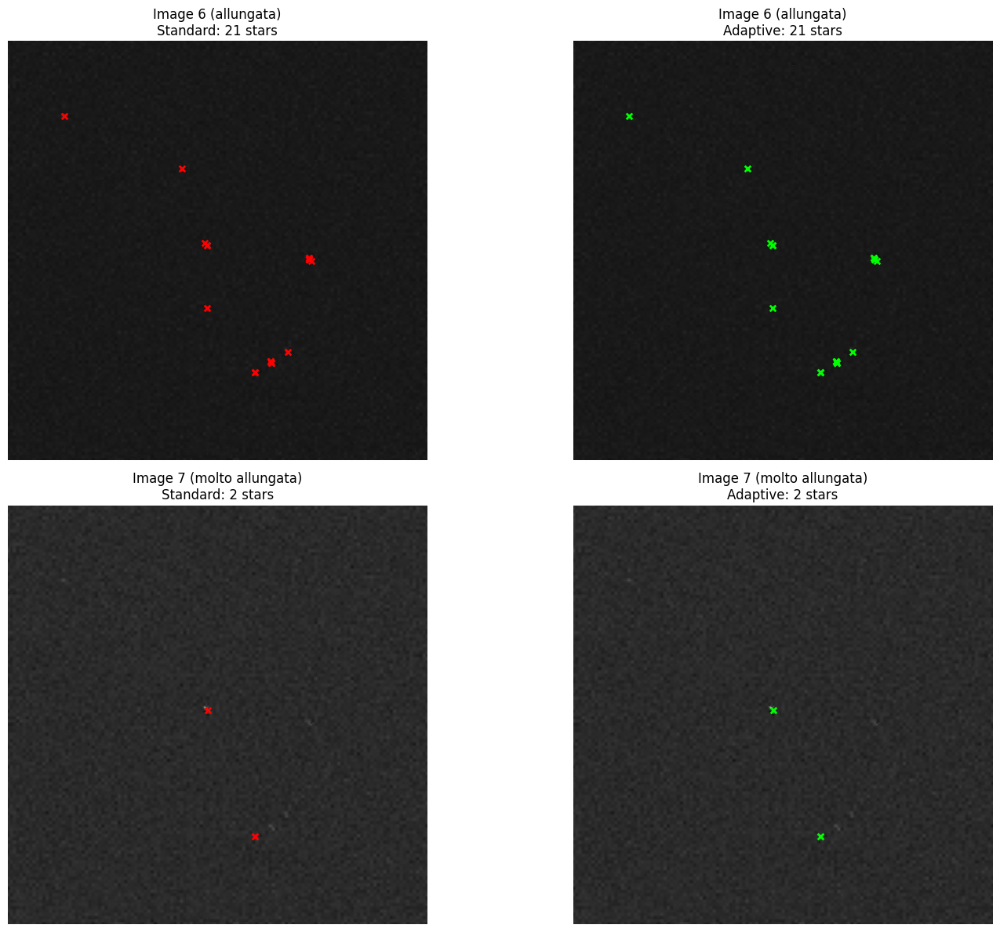

In [61]:
#Multiscale standard vs Adaptive on img6 e img7 (stretched stars)
print("=" * 60)
print("CONFRONTO: Standard vs Adaptive Detection (img6, img7)")
print("=" * 60)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

test_images = [denoised_images_tot[5], denoised_images_tot[6]]
test_labels = ["Image 6 (allungata)", "Image 7 (molto allungata)"]

for idx, (img, label) in enumerate(zip(test_images, test_labels)):
    # standard detection
    stars_standard = detect_stars_multiscale(img)
    
    # adaptive detection
    stars_adaptive = detect_stars_multiscale_adaptive(img, adapt_eccentricity=True)
    
    # Visualize: Standard
    ax_standard = axes[idx, 0]
    ax_standard.imshow(img, cmap='gray')
    for x, y in stars_standard:
        ax_standard.scatter(x, y, c='red', s=30, marker='x', linewidths=2)
    ax_standard.set_title(f"{label}\nStandard: {len(stars_standard)} stars")
    ax_standard.axis('off')
    
    # Visualize: Adaptive
    ax_adaptive = axes[idx, 1]
    ax_adaptive.imshow(img, cmap='gray')
    for x, y in stars_adaptive:
        ax_adaptive.scatter(x, y, c='lime', s=30, marker='x', linewidths=2)
    ax_adaptive.set_title(f"{label}\nAdaptive: {len(stars_adaptive)} stars")
    ax_adaptive.axis('off')
    
    print(f"\n{label}:")
    print(f"  Standard:  {len(stars_standard)} stars detected")
    print(f"  Adaptive:  {len(stars_adaptive)} stars detected")
    if len(stars_adaptive) > len(stars_standard):
        diff = len(stars_adaptive) - len(stars_standard)
        print(f"  → Improvement: +{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")
    elif len(stars_adaptive) < len(stars_standard):
        diff = len(stars_standard) - len(stars_adaptive)
        print(f"  → Reduction: -{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")

plt.tight_layout()
plt.show()


CONFRONTO: Standard vs Adaptive Detection (img6, img7)

Image 6 (allungata):
  Standard:  21 stars detected
  Adaptive:  21 stars detected

Image 7 (molto allungata):
  Standard:  2 stars detected
  Adaptive:  3 stars detected
  → Improvement: +1 stars (50.0%)


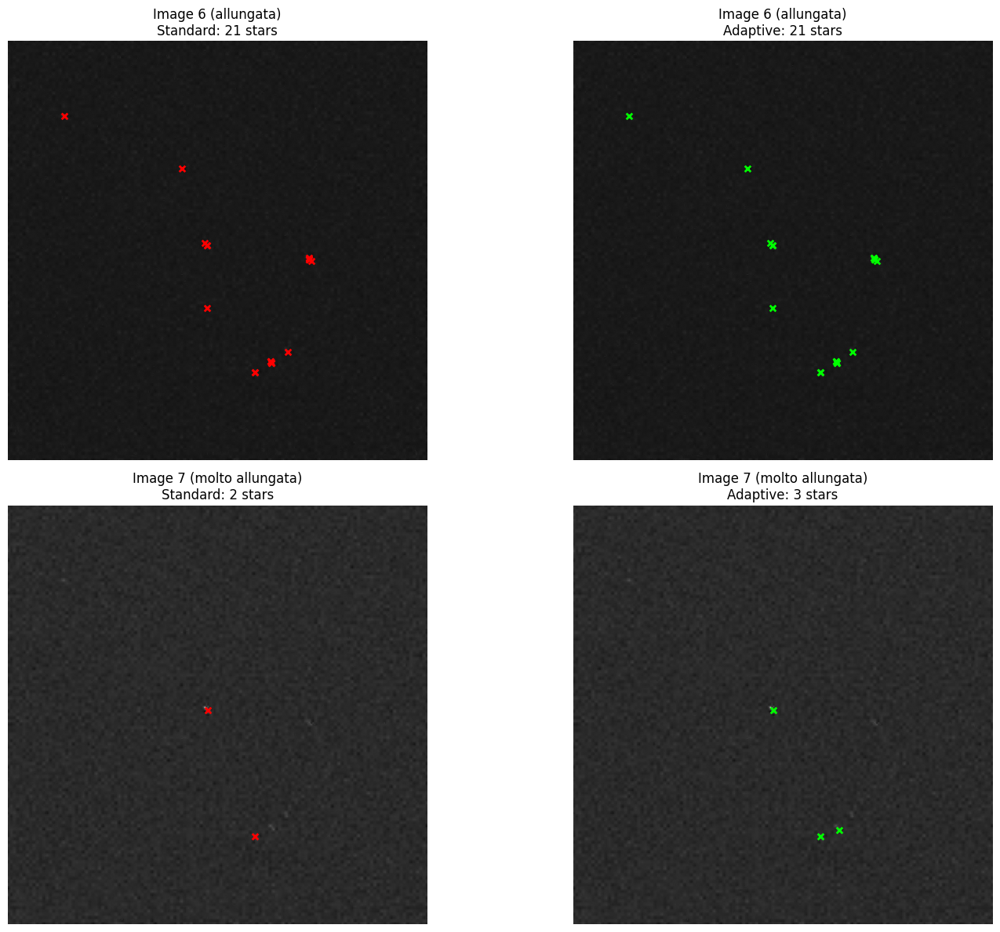

In [ ]:
#Multiscale standard vs Adaptive on img6 e img7 (stretched stars)
print("=" * 60)
print("CONFRONTO: Standard vs Adaptive Detection (img6, img7)")
print("=" * 60)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

test_images = [denoised_images_tot[5], denoised_images_tot[6]]
test_labels = ["Image 6 (allungata)", "Image 7 (molto allungata)"]

for idx, (img, label) in enumerate(zip(test_images, test_labels)):
    
    # adaptive detection
    stars_adaptive = detect_stars_multiscale_adaptive(img, adapt_eccentricity=True, th_std=1.3, ecc_threshold=0.16)
    
    # Visualize: Standard
    ax_standard = axes[idx, 0]
    ax_standard.imshow(img, cmap='gray')
    for x, y in stars_standard:
        ax_standard.scatter(x, y, c='red', s=30, marker='x', linewidths=2)
    ax_standard.set_title(f"{label}\nStandard: {len(stars_standard)} stars")
    ax_standard.axis('off')
    
    # Visualize: Adaptive
    ax_adaptive = axes[idx, 1]
    ax_adaptive.imshow(img, cmap='gray')
    for x, y in stars_adaptive:
        ax_adaptive.scatter(x, y, c='lime', s=30, marker='x', linewidths=2)
    ax_adaptive.set_title(f"{label}\nAdaptive: {len(stars_adaptive)} stars")
    ax_adaptive.axis('off')
    
    print(f"\n{label}:")
    print(f"  Standard:  {len(stars_standard)} stars detected")
    print(f"  Adaptive:  {len(stars_adaptive)} stars detected")
    if len(stars_adaptive) > len(stars_standard):
        diff = len(stars_adaptive) - len(stars_standard)
        print(f"  → Improvement: +{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")
    elif len(stars_adaptive) < len(stars_standard):
        diff = len(stars_standard) - len(stars_adaptive)
        print(f"  → Reduction: -{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")

plt.tight_layout()
plt.show()


To understand why we have the same results both for the standard and the adaptive version it is useful to give a look to the eccentricity map and to check if the eccentricity threshold was well set.

Eccentricity diagnosis - img7

📊 ECCENTRICITY STATISTICS:
  Min:     0.000
  Max:     0.290
  Media:   0.016
  Mediana: 0.013

🎯 COUNTING PIXELS FOR THRESHOLD:
  ecc > 0.3:     0 pixel ( 0.00%)
  ecc > 0.4:     0 pixel ( 0.00%)
  ecc > 0.5:     0 pixel ( 0.00%)
  ecc > 0.6:     0 pixel ( 0.00%)
  ecc > 0.7:     0 pixel ( 0.00%)


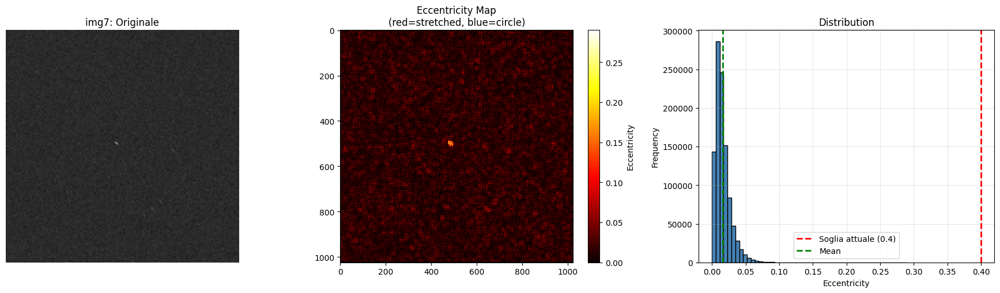

In [63]:
# Analizing eccentricity in img7

debug_img = denoised_images_tot[6] 
print("=" * 70)
print("Eccentricity diagnosis - img7")
print("=" * 70)

H, W = debug_img.shape
eccentricity_map = np.zeros((H, W))

# computing eccentricity (same function logic)
for y in range(5, H - 5):
    for x in range(5, W - 5):
        window = debug_img[y-5:y+6, x-5:x+6]
        yy, xx = np.meshgrid(np.arange(11), np.arange(11), indexing='ij')
        weights = window / (np.sum(window) + 1e-8)
        
        mxx = np.sum(weights * (xx - 5) ** 2)
        myy = np.sum(weights * (yy - 5) ** 2)
        mxy = np.sum(weights * (xx - 5) * (yy - 5))
        
        trace = mxx + myy
        det = mxx * myy - mxy ** 2
        if trace > 0:
            lambda1 = (trace + np.sqrt(max(trace**2 - 4*det, 0))) / 2
            lambda2 = (trace - np.sqrt(max(trace**2 - 4*det, 0))) / 2
            if lambda1 + lambda2 > 1e-8:
                eccentricity_map[y, x] = (lambda1 - lambda2) / (lambda1 + lambda2)

# Statistiche
ecc_nonzero = eccentricity_map[eccentricity_map > 0]
print(f"\n📊 ECCENTRICITY STATISTICS:")
print(f"  Min:     {np.min(ecc_nonzero):.3f}")
print(f"  Max:     {np.max(ecc_nonzero):.3f}")
print(f"  Media:   {np.mean(ecc_nonzero):.3f}")
print(f"  Mediana: {np.median(ecc_nonzero):.3f}")

print(f"\n🎯 COUNTING PIXELS FOR THRESHOLD:")
for th in [0.3, 0.4, 0.5, 0.6, 0.7]:
    count = np.sum(eccentricity_map > th)
    pct = 100 * count / (H * W)
    print(f"  ecc > {th:.1f}: {count:5d} pixel ({pct:5.2f}%)")

# heatmap
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Original
axes[0].imshow(debug_img, cmap='gray')
axes[0].set_title('img7: Originale')
axes[0].axis('off')

# Heatmap eccentricity
im = axes[1].imshow(eccentricity_map, cmap='hot')
axes[1].set_title('Eccentricity Map\n(red=stretched, blue=circle)')
plt.colorbar(im, ax=axes[1], label='Eccentricity')

# Istogramma
axes[2].hist(ecc_nonzero, bins=50, color='steelblue', edgecolor='black')
axes[2].axvline(0.4, color='red', linestyle='--', linewidth=2, label='Soglia attuale (0.4)')
axes[2].axvline(np.mean(ecc_nonzero), color='green', linestyle='--', linewidth=2, label='Mean')
axes[2].set_xlabel('Eccentricity')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Distribution')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


The eccentricity is very low with respect to our threshold, for this reason our stars are "not stretched enough" to be detected. The idea is to set the eccentricity threshold to a lower value


=== ECCENTRICITY STATISTICS (IMG7) ===
Mean:         0.016060
Median:       0.013361
Mode (peak):  0.010156
Std Dev:       0.011672
Min:           0.000000
Max:           0.290162

Ratio Mean/Mode: 1.58x


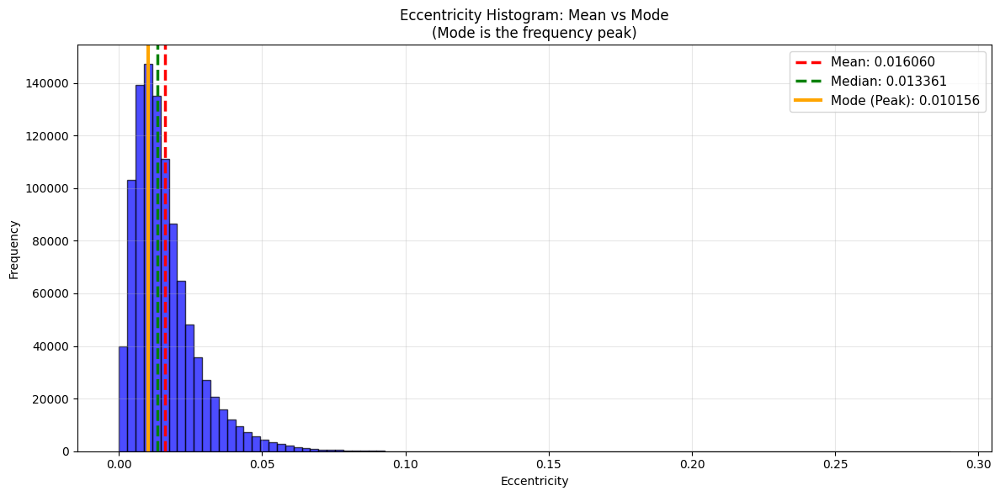

In [65]:
# Analyzing mean and mode of eccentricity distribution
# Checking which value to use

#Computing mode, mean and median of eccentricity distribution
ecc_nonzero = eccentricity_map[eccentricity_map > 0]
ecc_mean = np.mean(ecc_nonzero)
ecc_median = np.median(ecc_nonzero)
ecc_std = np.std(ecc_nonzero)

# computing the histogram peak 
hist_counts, hist_bins = np.histogram(ecc_nonzero, bins=100)
peak_bin_idx = np.argmax(hist_counts)
peak_frequency = hist_bins[peak_bin_idx]  # centro del bin col massimo
peak_frequency_right = hist_bins[peak_bin_idx + 1]  # bordo destro
ecc_mode = (peak_frequency + peak_frequency_right) / 2

print(f"\n=== ECCENTRICITY STATISTICS (IMG7) ===")
print(f"Mean:         {ecc_mean:.6f}")
print(f"Median:       {ecc_median:.6f}")
print(f"Mode (peak):  {ecc_mode:.6f}")
print(f"Std Dev:       {ecc_std:.6f}")
print(f"Min:           {np.min(ecc_nonzero):.6f}")
print(f"Max:           {np.max(ecc_nonzero):.6f}")
print(f"\nRatio Mean/Mode: {ecc_mean/ecc_mode:.2f}x")

# Visualizza media e moda sull'istogramma
fig, ax = plt.subplots(figsize=(12, 6))
ax.hist(ecc_nonzero, bins=100, alpha=0.7, color='blue', edgecolor='black')
ax.axvline(ecc_mean, color='red', linestyle='--', linewidth=2.5, label=f'Mean: {ecc_mean:.6f}')
ax.axvline(ecc_median, color='green', linestyle='--', linewidth=2.5, label=f'Median: {ecc_median:.6f}')
ax.axvline(ecc_mode, color='orange', linestyle='-', linewidth=3, label=f'Mode (Peak): {ecc_mode:.6f}')
ax.set_xlabel('Eccentricity')
ax.set_ylabel('Frequency')
ax.set_title('Eccentricity Histogram: Mean vs Mode\n(Mode is the frequency peak)')
ax.legend(fontsize=11)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()



The peak, or mode, represents the most frequent value. By using the mean we can capture more stretched stars, while using the mode we focus on the main population.
Because we want to work on precision, we will use the mode.

Before immediately changing the eccentricity parameter into an input parameter, let's also analyze the intensity of the stars in the image in order to set also relative values of std and mean thresholds. We do this because some stars that were not detected in img7 were not too stretched or too small to be detected but most probably they were "too grey" to pop up from the scan analisis that was done on the image

=== TOP 10 BRIGHTER PIXELS ===
#   Center   ΔMean    ΔVar     Pass th_mean=4  Pass th_std=3   PASS 
1   115.0    16.03    57.48    ✓               ✓               ✓    
2   102.0    19.08    123.62   ✓               ✓               ✓    
3   101.0    20.30    -9.96    ✓               ✗               ✗    
4   99.0     18.73    2.43     ✓               ✗               ✗    
5   97.0     16.81    4.26     ✓               ✓               ✓    
6   94.0     19.68    -3.84    ✓               ✗               ✗    
7   94.0     17.58    14.22    ✓               ✓               ✓    
8   91.0     15.42    100.60   ✓               ✓               ✓    
9   88.0     16.91    58.35    ✓               ✓               ✓    
10  88.0     20.35    16.10    ✓               ✓               ✓    

=== STATISTICS ===
Total candidates (top 0.5% intensity): 2937
Pass th_mean > 4:  175/2937 (6.0%)
Pass th_std > 3:   142/2937 (4.8%)
Pass BOTH:         97/2937 (3.3%)


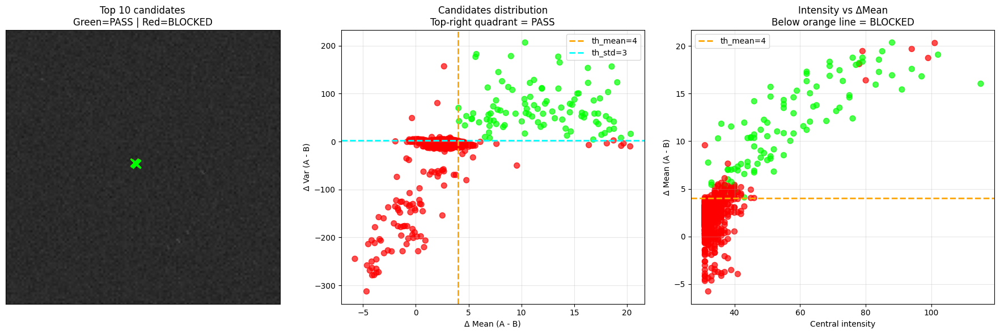

In [69]:
# Checking if the weak stars are filtered out by absolute thresholds
# Find the brightest pixels (potential stars)
threshold_bright = np.percentile(denoised_images_tot[6], 99.5)  # top 0.5%
bright_pixels = np.where(denoised_images_tot[6] > threshold_bright)

# Analyze the intensity around each bright pixel
intensities = []
for y, x in zip(bright_pixels[0], bright_pixels[1]):
    if y > 7 and y < denoised_images_tot[6].shape[0]-7 and x > 7 and x < denoised_images_tot[6].shape[1]-7:
        # Window A (inner) and B (outer)
        A = denoised_images_tot[6][y-3:y+4, x-3:x+4]
        B = denoised_images_tot[6][y-7:y+8, x-7:x+8]
        
        mean_A = np.mean(A)
        mean_B = np.mean(B)
        var_A = np.var(A)
        var_B = np.var(B)
        
        # Current conditions
        diff_mean = mean_A - mean_B
        diff_var = var_A - var_B
        
        intensities.append({
            'x': x, 'y': y,
            'center': denoised_images_tot[6][y, x],
            'mean_A': mean_A,
            'mean_B': mean_B,
            'diff_mean': diff_mean,
            'var_A': var_A,
            'var_B': var_B,
            'diff_var': diff_var,
            'passes_th_mean_4': diff_mean > 4,
            'passes_th_std_3': diff_var > 3,
            'passes_both': (diff_mean > 4) and (diff_var > 3)
        })

# Sort by central intensity
intensities.sort(key=lambda x: x['center'], reverse=True)

print(f"=== TOP 10 BRIGHTER PIXELS ===")
print(f"{'#':<3} {'Center':<8} {'ΔMean':<8} {'ΔVar':<8} {'Pass th_mean=4':<15} {'Pass th_std=3':<15} {'PASS':<5}")
print("="*80)
for i, data in enumerate(intensities[:10]):
    print(f"{i+1:<3} {data['center']:<8.1f} {data['diff_mean']:<8.2f} {data['diff_var']:<8.2f} "
          f"{'✓' if data['passes_th_mean_4'] else '✗':<15} "
          f"{'✓' if data['passes_th_std_3'] else '✗':<15} "
          f"{'✓' if data['passes_both'] else '✗':<5}")

# Count how many pass
total = len(intensities)
pass_mean = sum(1 for d in intensities if d['passes_th_mean_4'])
pass_var = sum(1 for d in intensities if d['passes_th_std_3'])
pass_both = sum(1 for d in intensities if d['passes_both'])

print(f"\n=== STATISTICS ===")
print(f"Total candidates (top 0.5% intensity): {total}")
print(f"Pass th_mean > 4:  {pass_mean}/{total} ({100*pass_mean/total:.1f}%)")
print(f"Pass th_std > 3:   {pass_var}/{total} ({100*pass_var/total:.1f}%)")
print(f"Pass BOTH:         {pass_both}/{total} ({100*pass_both/total:.1f}%)")
# Visualize on the map
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

ax = axes[0]
ax.imshow(denoised_images_tot[6], cmap='gray')
for data in intensities[:10]:
    color = 'lime' if data['passes_both'] else 'red'
    ax.plot(data['x'], data['y'], 'x', color=color, markersize=10, markeredgewidth=2)
ax.set_title(f'Top 10 candidates\nGreen=PASS | Red=BLOCKED')
ax.set_xticks([])
ax.set_yticks([])

ax = axes[1]
diff_means = [d['diff_mean'] for d in intensities]
diff_vars = [d['diff_var'] for d in intensities]
colors_scatter = ['lime' if d['passes_both'] else 'red' for d in intensities]
ax.scatter(diff_means, diff_vars, c=colors_scatter, alpha=0.7, s=50)
ax.axvline(4, color='orange', linestyle='--', linewidth=2, label='th_mean=4')
ax.axhline(3, color='cyan', linestyle='--', linewidth=2, label='th_std=3')
ax.set_xlabel('Δ Mean (A - B)')
ax.set_ylabel('Δ Var (A - B)')
ax.set_title('Candidates distribution\nTop-right quadrant = PASS')
ax.legend()
ax.grid(alpha=0.3)

ax = axes[2]
centers = [d['center'] for d in intensities]
ax.scatter(centers, diff_means, c=colors_scatter, alpha=0.7, s=50)
ax.axhline(4, color='orange', linestyle='--', linewidth=2, label='th_mean=4')
ax.set_xlabel('Central intensity')
ax.set_ylabel('Δ Mean (A - B)')
ax.set_title('Intensity vs ΔMean\nBelow orange line = BLOCKED')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Weak stars have smalller ΔMean and ΔVar, for this reason absolute threshold that were setted in the previous functions (th_mean=4, th_std=3) exclude them. One way to solve this problem is to use relative threshold computed directly on the image characteristics.

In [ ]:
def detect_stars_multiscale_adaptive_v2(img, 
                                        A_sizes=[3,5,7], 
                                        B_sizes=[7,11,15],
                                        th_mean=3, th_std=1.3,
                                        adapt_eccentricity=True,
                                        ecc_threshold=None,
                                        scale_eccentricity_factor=0.7):

    stars = []
    H, W = img.shape

    # Calcola mappa di eccentricità SEMPRE (se adapt_eccentricity=True)
    eccentricity_map = None
    if adapt_eccentricity:
        eccentricity_map = np.zeros((H, W))
        for y in range(5, H - 5):
            for x in range(5, W - 5):
                window = img[y-5:y+6, x-5:x+6]
                yy, xx = np.meshgrid(np.arange(11), np.arange(11), indexing='ij')
                weights = window / (np.sum(window) + 1e-8)
                
                mxx = np.sum(weights * (xx - 5) ** 2)
                myy = np.sum(weights * (yy - 5) ** 2)
                mxy = np.sum(weights * (xx - 5) * (yy - 5))
                
                trace = mxx + myy
                det = mxx * myy - mxy ** 2
                if trace > 0:
                    lambda1 = (trace + np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    lambda2 = (trace - np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    if lambda1 + lambda2 > 1e-8:
                        eccentricity_map[y, x] = (lambda1 - lambda2) / (lambda1 + lambda2)

    # Rilevamento
    for A_size, B_size in zip(A_sizes, B_sizes):
        rA = A_size // 2
        rB = B_size // 2

        for y in range(rB, H - rB):
            for x in range(rB, W - rB):
                rA_adapted = rA
                rB_adapted = rB
                
                # Adatta finestre in base all'eccentricità
                if adapt_eccentricity and eccentricity_map is not None and ecc_threshold is not None:
                    ecc = eccentricity_map[y, x]
                    if ecc > ecc_threshold:
                        scale_factor = 1 + scale_eccentricity_factor * ecc
                        rA_adapted = max(rA, int(rA * scale_factor))
                        rB_adapted = max(rB, int(rB * scale_factor))
                
                # Controlla bounds
                if y - rB_adapted < 0 or y + rB_adapted >= H or x - rB_adapted < 0 or x + rB_adapted >= W:
                    continue

                A = img[y-rA_adapted:y+rA_adapted+1, x-rA_adapted:x+rA_adapted+1]
                B = img[y-rB_adapted:y+rB_adapted+1, x-rB_adapted:x+rB_adapted+1]

                center = img[y, x]
                if center != np.max(A):
                    continue

                mean_A = np.mean(A)
                mean_B = np.mean(B)
                if mean_A <= mean_B + th_mean:
                    continue

                var_A = np.var(A)
                var_B = np.var(B)
                if var_A <= var_B + th_std:
                    continue

                stars.append((x, y))

    # Rimuovi duplicati
    if len(stars) == 0:
        return []
    
    stars_array = np.array(stars)
    from scipy.spatial.distance import cdist
    distances = cdist(stars_array, stars_array)
    
    keep = []
    used = set()
    
    for i in range(len(stars)):
        if i in used:
            continue
        
        close_stars = np.where((distances[i] < 3) & (distances[i] > 0))[0]
        
        if len(close_stars) == 0:
            keep.append(stars[i])
            used.add(i)
        else:
            cluster_indices = [i] + list(close_stars)
            cluster_stars = [stars[idx] for idx in cluster_indices]
            cluster_center = np.mean(cluster_stars, axis=0)
            distances_to_center = [np.linalg.norm(np.array(s) - cluster_center) for s in cluster_stars]
            best_idx = cluster_indices[np.argmin(distances_to_center)]
            keep.append(stars[best_idx])
            used.update(cluster_indices)
    
    return keep

=== SCENARIO 1: Disattiva eccentricità (comportamento classico) ===
Stelle rilevate (senza adattamento): 0

=== SCENARIO 2: Usa MODA (picco frequenza) ===
  Moda eccentricità: 0.010156
  Stelle rilevate (con moda): 0

=== SCENARIO 3: Usa MEDIA ===
  Media eccentricità: 0.016060
  Stelle rilevate (con media): 0

=== SCENARIO 4: Usa MEDIANA ===
  Mediana eccentricità: 0.013361
  Stelle rilevate (con mediana): 0


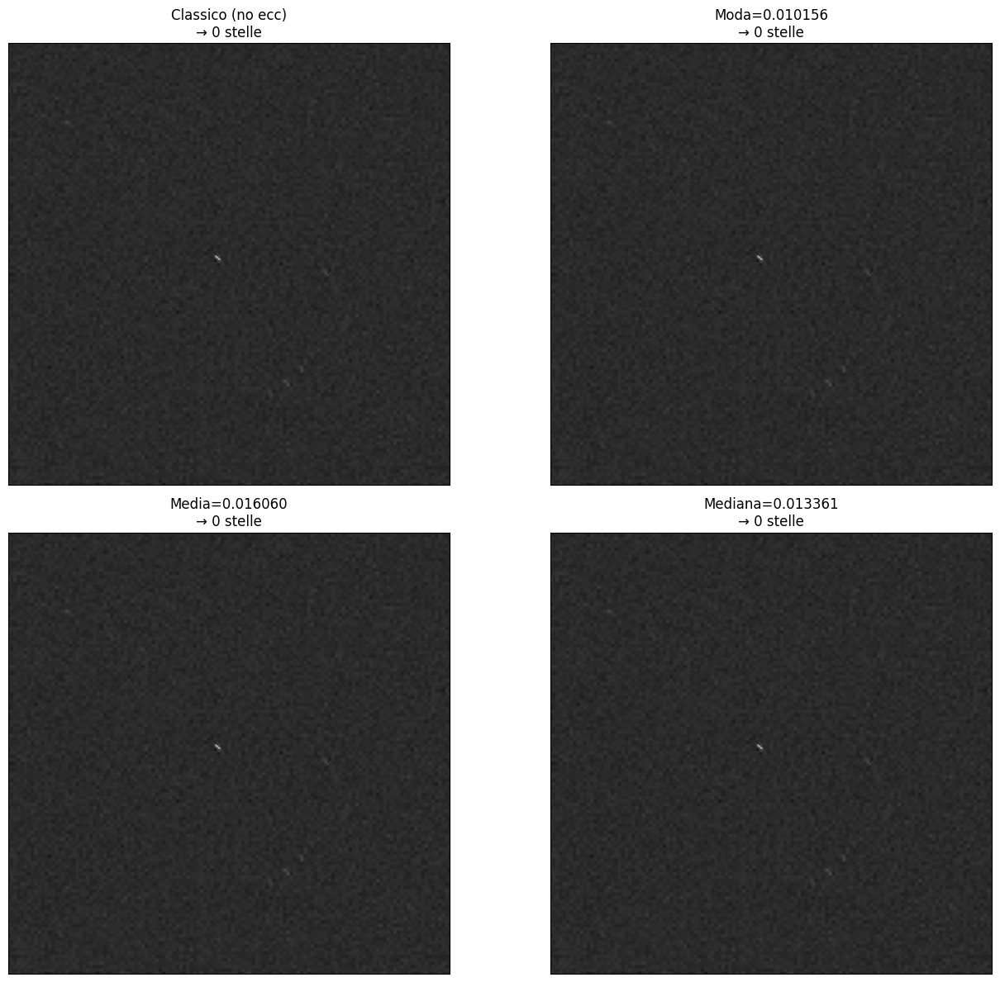


💡 ANALISI:
  • Moda   cattura il picco principale (popolazione più frequente)
  • Media  include stelle più allungate
  • Mediana è compromesso tra moda e media
  → Quale scegliere? Dipende dal tuo caso d'uso:
     - Alta precisione (meno falsi positivi) → usa MODA
     - Alta sensibilità (meno falsi negativi) → usa MEDIA


In [ ]:
# === ESEMPI: Come usare detect_stars_multiscale_adaptive_v2 con DIVERSE SOGLIE ===

print("=== SCENARIO 1: Disattiva eccentricità (comportamento classico) ===")
stars_classic = detect_stars_multiscale_adaptive_v2(denoised_images_tot[6],  # immagine 7 denoised
                                                     adapt_eccentricity=False)
print(f"Stelle rilevate (senza adattamento): {len(stars_classic)}")

print("\n=== SCENARIO 2: Usa MODA (picco frequenza) ===")
ecc_nonzero = eccentricity_map[eccentricity_map > 0]
hist_counts, hist_bins = np.histogram(ecc_nonzero, bins=100)
peak_bin_idx = np.argmax(hist_counts)
ecc_mode = (hist_bins[peak_bin_idx] + hist_bins[peak_bin_idx + 1]) / 2
print(f"  Moda eccentricità: {ecc_mode:.6f}")

stars_mode = detect_stars_multiscale_adaptive_v2(denoised_images_tot[6],  # immagine 7 denoised
                                                  adapt_eccentricity=True,
                                                  ecc_threshold=ecc_mode)
print(f"  Stelle rilevate (con moda): {len(stars_mode)}")

print("\n=== SCENARIO 3: Usa MEDIA ===")
ecc_mean = np.mean(ecc_nonzero)
print(f"  Media eccentricità: {ecc_mean:.6f}")

stars_mean = detect_stars_multiscale_adaptive_v2(denoised_images_tot[6], 
                                                  adapt_eccentricity=True,
                                                  ecc_threshold=ecc_mean)
print(f"  Stelle rilevate (con media): {len(stars_mean)}")

print("\n=== SCENARIO 4: Usa MEDIANA ===")
ecc_median = np.median(ecc_nonzero)
print(f"  Mediana eccentricità: {ecc_median:.6f}")

stars_median = detect_stars_multiscale_adaptive_v2(denoised_images_tot[6], 
                                                    adapt_eccentricity=True,
                                                    ecc_threshold=ecc_median)
print(f"  Stelle rilevate (con mediana): {len(stars_median)}")

# Visualizza confronto
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

titles_compare = ['Classico (no ecc)', f'Moda={ecc_mode:.6f}', 
                  f'Media={ecc_mean:.6f}', f'Mediana={ecc_median:.6f}']
stars_compare = [stars_classic, stars_mode, stars_mean, stars_median]
counts_compare = [len(s) for s in stars_compare]

for idx, (ax, title, stars, count) in enumerate(zip(axes, titles_compare, stars_compare, counts_compare)):
    ax.imshow(denoised_images_tot[6], cmap='gray')
    
    if stars:
        x_coords = [s[0] for s in stars]
        y_coords = [s[1] for s in stars]
        colors_plot = ['lime', 'cyan', 'yellow', 'magenta']
        ax.scatter(x_coords, y_coords, c=colors_plot[idx], s=100, marker='x', linewidths=2)
    
    ax.set_title(f"{title}\n→ {count} stelle")
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

print(f"\n💡 ANALISI:")
print(f"  • Moda   cattura il picco principale (popolazione più frequente)")
print(f"  • Media  include stelle più allungate")
print(f"  • Mediana è compromesso tra moda e media")
print(f"  → Quale scegliere? Dipende dal tuo caso d'uso:")
print(f"     - Alta precisione (meno falsi positivi) → usa MODA")
print(f"     - Alta sensibilità (meno falsi negativi) → usa MEDIA")


CONFRONTO: Standard vs Adaptive Detection (img6, img7)

Image 6 (allungata):
  Standard:  21 stars detected
  Adaptive:  0 stars detected
  → Reduction: -21 stars (100.0%)

Image 7 (molto allungata):
  Standard:  2 stars detected
  Adaptive:  0 stars detected
  → Reduction: -2 stars (100.0%)


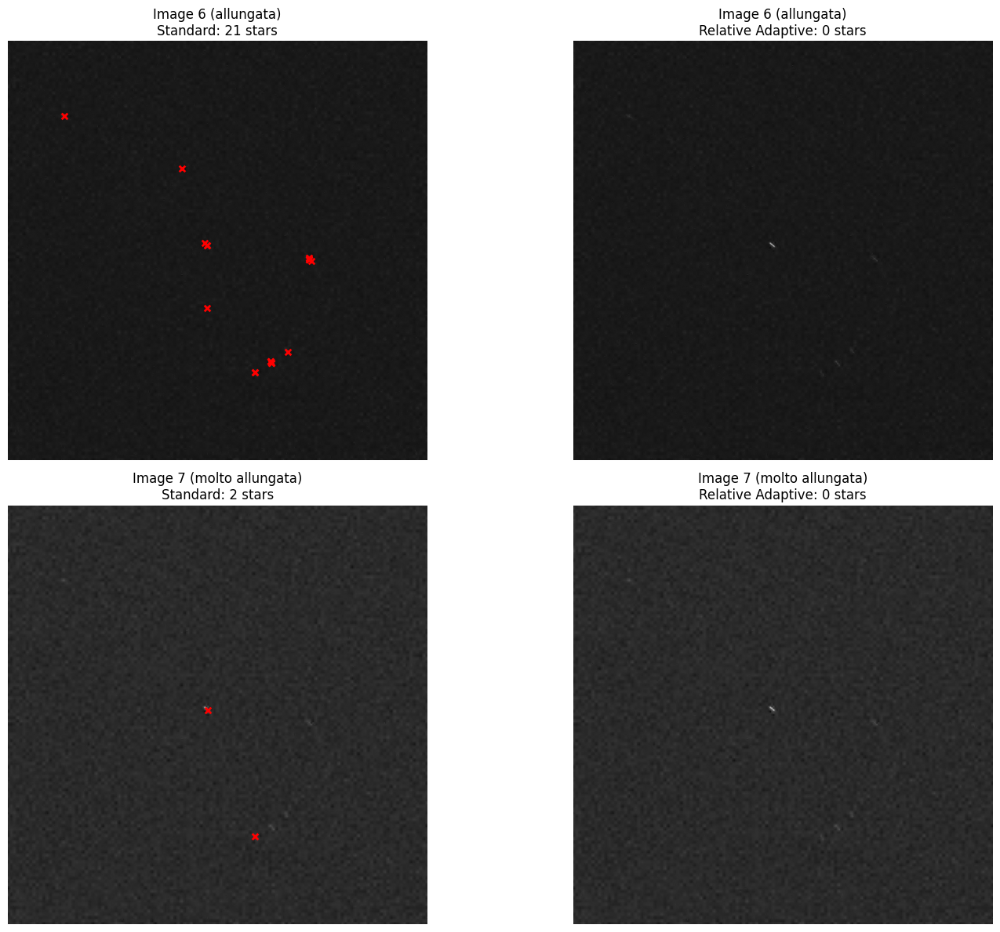

In [74]:
#Adaptive vs Relative Adaptive on img6 e img7 (stretched stars)
print("=" * 60)
print("CONFRONTO: Standard vs Adaptive Detection (img6, img7)")
print("=" * 60)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

test_images = [denoised_images_tot[5], denoised_images_tot[6]]
test_labels = ["Image 6 (allungata)", "Image 7 (molto allungata)"]

for idx, (img, label) in enumerate(zip(test_images, test_labels)):
    # adaptive detection
    stars_standard = detect_stars_multiscale(img)
    
    # relative adaptive detection
    stars_adaptive = detect_stars_multiscale_adaptive_v2(img, adapt_eccentricity=True, ecc_threshold=0.16, )
    
    # Visualize: Standard
    ax_standard = axes[idx, 0]
    ax_standard.imshow(img, cmap='gray')
    for x, y in stars_standard:
        ax_standard.scatter(x, y, c='red', s=30, marker='x', linewidths=2)
    ax_standard.set_title(f"{label}\nStandard: {len(stars_standard)} stars")
    ax_standard.axis('off')
    
    # Visualize: Relative Adaptive
    ax_adaptive = axes[idx, 1]
    ax_adaptive.imshow(img, cmap='gray')
    for x, y in stars_adaptive:
        ax_adaptive.scatter(x, y, c='lime', s=30, marker='x', linewidths=2)
    ax_adaptive.set_title(f"{label}\nRelative Adaptive: {len(stars_adaptive)} stars")
    ax_adaptive.axis('off')
    
    print(f"\n{label}:")
    print(f"  Standard:  {len(stars_standard)} stars detected")
    print(f"  Adaptive:  {len(stars_adaptive)} stars detected")
    if len(stars_adaptive) > len(stars_standard):
        diff = len(stars_adaptive) - len(stars_standard)
        print(f"  → Improvement: +{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")
    elif len(stars_adaptive) < len(stars_standard):
        diff = len(stars_standard) - len(stars_adaptive)
        print(f"  → Reduction: -{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")

plt.tight_layout()
plt.show()


We can now check if our answers are correct and move on writing the final detection function

In [ ]:
stars_adaptive_new = [detect_stars_multiscale_adaptive_v2(denoised_images_tot[5], adapt_eccentricity=True, ecc_threshold=0.16),
                      detect_stars_multiscale_adaptive_v2(denoised_images_tot[6], adapt_eccentricity=True, ecc_threshold=0.16)]

print("\n=== Match Analysis ===\n")
for i, stars in enumerate(stars_adaptive_new):
    tp, fp, fn = match_with_ground_truth(stars, stars_perfect, max_distance=5)
    
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    print(f"Image {i+3}:")
    print(f"  True Positives:  {tp}")
    print(f"  False Positives: {fp}")
    print(f"  False Negatives: {fn}")
    print(f"  Precision: {precision:.2%}")
    print(f"  Recall:    {recall:.2%}")
    print(f"  F1-Score:  {f1:.2%}")
    print()

## Writing the final functions

Denoising the images

# Lost detection function

The program that we want to improve use an iterative weighted center of gravity algorithm to detect stars, and more precisely their centroids.

IWCoG Algorithm from LOST

In [77]:
def basic_threshold(image):

    total_pixels = image.size
    mean = np.mean(image)
    std = np.std(image)
    return mean + (std * 5)

In [ ]:
def iwcog_helper(image, start_idx, cutoff, checked_indices, image_width, image_height):

    star_indices = []
    x_min = start_idx % image_width
    x_max = start_idx % image_width
    y_min = start_idx // image_width
    y_max = start_idx // image_width
    max_intensity = 0
    guess = start_idx
    is_valid = True
    
    # Stack per evitare ricorsione profonda (problema in Python)
    stack = [start_idx]
    
    while stack:
        i = stack.pop()
        
        # Controlla bounds e se già visitato
        if i < 0 or i >= image_width * image_height:
            continue
        if i in checked_indices:
            continue
        if image.flat[i] < cutoff:
            continue
            
        # Marca come visitato
        checked_indices.add(i)
        star_indices.append(i)
        
        # Controlla se tocca i bordi (stella non valida)
        x = i % image_width
        y = i // image_width
        if x == 0 or x == image_width - 1 or y == 0 or y == image_height - 1:
            is_valid = False
        
        # Aggiorna bounding box
        if x > x_max:
            x_max = x
        elif x < x_min:
            x_min = x
        if y > y_max:
            y_max = y
        elif y < y_min:
            y_min = y
        
        # Aggiorna intensità massima
        if image.flat[i] > max_intensity:
            max_intensity = image.flat[i]
            guess = i
        
        # Aggiungi vicini allo stack (4-connectivity)
        if x < image_width - 1:
            stack.append(i + 1)  # right
        if x > 0:
            stack.append(i - 1)  # left
        if y < image_height - 1:
            stack.append(i + image_width)  # down
        if y > 0:
            stack.append(i - image_width)  # up
    
    return star_indices, x_min, x_max, y_min, y_max, max_intensity, guess, is_valid

In [ ]:
def iterative_weighted_cog(image, min_change=0.0002, max_iterations=100000):

    image_height, image_width = image.shape
    result = []
    
    # Calcola la soglia
    cutoff = basic_threshold(image)
    print(f"Threshold calcolata: {cutoff:.2f}")
    
    # Set di pixel già controllati
    checked_indices = set()
    
    # Scansiona l'immagine pixel per pixel
    for i in range(image_height * image_width):
        # Controlla se il pixel è sopra soglia e non ancora visitato
        if image.flat[i] >= cutoff and i not in checked_indices:
            # Trova tutti i pixel connessi di questa stella
            star_indices, x_min, x_max, y_min, y_max, max_intensity, guess, is_valid = \
                iwcog_helper(image, i, cutoff, checked_indices, image_width, image_height)
            
            # Salta se stella non valida (tocca i bordi)
            if not is_valid:
                continue
            
            # Calcola dimensioni
            x_diameter = (x_max - x_min) + 1
            y_diameter = (y_max - y_min) + 1
            
            # Calcola FWHM (Full Width Half Maximum)
            count = sum(1 for idx in star_indices if image.flat[idx] > max_intensity / 2)
            fwhm = np.sqrt(count)
            
            # Calcola standard deviation dalla FWHM
            # sigma = FWHM / (2 * sqrt(2 * ln(2)))
            standard_deviation = fwhm / (2.0 * np.sqrt(2.0 * np.log(2.0)))
            modified_std_dev = 2.0 * (standard_deviation ** 2)
            
            # Prima stima: pixel con intensità massima
            guess_x_coord = float(guess % image_width)
            guess_y_coord = float(guess // image_width)
            
            # Iterazione per raffinare il centroide
            change = np.inf
            iteration = 0
            
            while change > min_change and iteration < max_iterations:
                iteration += 1
                
                # Reset delle somme pesate
                x_weighted_coord_mag_sum = 0.0
                y_weighted_coord_mag_sum = 0.0
                weighted_mag_sum = 0.0
                
                # Calcola il centroide pesato
                for idx in star_indices:
                    curr_x_coord = float(idx % image_width)
                    curr_y_coord = float(idx // image_width)
                    
                    # Calcola peso gaussiano
                    # w = I_max * exp(-((x-x_guess)^2 + (y-y_guess)^2) / (2*sigma^2))
                    exponent = -((curr_x_coord - guess_x_coord) ** 2 + 
                                 (curr_y_coord - guess_y_coord) ** 2) / modified_std_dev
                    w = max_intensity * np.exp(exponent)
                    
                    # Accumula somme pesate
                    pixel_intensity = float(image.flat[idx])
                    x_weighted_coord_mag_sum += w * curr_x_coord * pixel_intensity
                    y_weighted_coord_mag_sum += w * curr_y_coord * pixel_intensity
                    weighted_mag_sum += w * pixel_intensity
                
                # Nuova stima del centroide
                x_temp = x_weighted_coord_mag_sum / weighted_mag_sum
                y_temp = y_weighted_coord_mag_sum / weighted_mag_sum
                
                # Calcola quanto è cambiato
                change = abs(guess_x_coord - x_temp) + abs(guess_y_coord - y_temp)
                
                # Aggiorna per prossima iterazione
                guess_x_coord = x_temp
                guess_y_coord = y_temp
            
            # Aggiungi stella al risultato
            # +0.5 per centrare nel pixel (convenzione LOST)
            result.append((
                guess_x_coord + 0.5,
                guess_y_coord + 0.5,
                x_diameter / 2.0,  # radius_x
                y_diameter / 2.0,  # radius_y
                len(star_indices)  # numero di pixel
            ))
    
    return result

# Final statistics and comparison